Implemented hit selection, events scatter, ion heatmap, electrons time of flight, ions time of flight, merging multiple runs, spatial selection view, calibration choice of lines with corresponding zoomed-in views, calibration curve fit and apply with mq column, make multiple threshold selections, spatial selection view with angle, fish plots, binning by number of events, choose appropriate binning for mq and ion tof, background with multiple runs downsampled to selected number of pulses, waterfall plots, heatmaps for binned number of events

Additions:
+ normalized absolute plots
+ waterfall plots for electrons
+ improved fish plots
+ correlation mq heatmap by numpy cov
+ correlation etof and ion tof heatmap by numpy cov
+ 1d correlation mq plot by numpy cov
+ correlation mq heatmap with taran code
+ partial correlation mq heatmap
+ partial correlation mq heatmap with varying alpha
+ incorporate ion merging
+ nevents_binning for ion only
+ big mq plot

# Imports and functions

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter

In [2]:
TIME_BETWEEN_PULSES = 3.54462e-6
CHANNELS_PER_PULSE = 14080


    
def read(runid):
    'Read the preprocessed data of run with ID runid saved in the h5 file with a corresponding name'
    'Outputs dataframes per event, per pulse, and xarrays etof, pnccd in that order'
    
    filename = '../preprocess/datarun' + str(runid) + '.h5'
    
    dfevent = pd.read_hdf(filename, 'dfevent')
    dfpulse = pd.read_hdf(filename, 'dfpulse')
    
    etof = xr.open_dataarray(filename, group="etof")
    pnccd = xr.open_dataarray(filename, group="pnccd")
    
    return dfevent, dfpulse, etof, pnccd



def events_selection(runs,thresholds,num_pulses=None):
    'Reads one or multiple runs from h5 files'
    'Makes a pulse selection based on the number of events per pulse between the defined thresholds'
    'If multiple runs are passed, will merge the runs, once hit selected'
    'Thresholds can be between one and three tuples (lower threshold, upper threshold)'
    'Downsamples by num_pulses'
    
    lower_threshold1, upper_threshold1 = thresholds[0]
    selected_dfevents1 = list()
    selected_dfpulses1 = list()
    selected_etofs1 = list()
    
    if len(thresholds) > 1:
        lower_threshold2, upper_threshold2 = thresholds[1]
        selected_dfevents2 = list()
        selected_dfpulses2 = list()
        selected_etofs2 = list()
    
    if len(thresholds) > 2:
        lower_threshold3, upper_threshold3 = thresholds[2]  
        selected_dfevents3 = list()
        selected_dfpulses3 = list()
        selected_etofs3 = list()
    
    dataframes = dict()
    
    if type(num_pulses) == int:
        num_pulses_run = int(num_pulses/len(runs))
    
    for run in runs:
        
        dfevent, dfpulse, etof, pnccd = read(run)
        
        selections = list()
        
        plt.figure()
        plt.scatter(dfpulse.pulseId,dfpulse.nevents_pulse,c='black',label='All pulses')
        
        if type(num_pulses) == int:
            dfpulse = dfpulse.sample(n=num_pulses_run)
            
        selected_dfpulse1 = dfpulse[lower_threshold1 < dfpulse.nevents_pulse][dfpulse.nevents_pulse < upper_threshold1]
        selected_dfevent1 = dfevent[dfevent.pulseId.isin(selected_dfpulse1.pulseId)]
        selected_etof1 = etof.sel(pulseId=etof.coords['pulseId'].isin(selected_dfpulse1.pulseId))
        selections.append((selected_dfevent1, selected_dfpulse1, selected_etof1))
        plt.scatter(selected_dfpulse1.pulseId,selected_dfpulse1.nevents_pulse,c='r',label=f'Between {lower_threshold1} and {upper_threshold1}')
        
        if len(thresholds) > 1:
            
            selected_dfpulse2 = dfpulse[lower_threshold2 < dfpulse.nevents_pulse][dfpulse.nevents_pulse < upper_threshold2]
            selected_dfevent2 = dfevent[dfevent.pulseId.isin(selected_dfpulse2.pulseId)]
            selected_etof2 = etof.sel(pulseId=etof.coords['pulseId'].isin(selected_dfpulse2.pulseId))
            selections.append((selected_dfevent2, selected_dfpulse2, selected_etof2))
            plt.scatter(selected_dfpulse2.pulseId,selected_dfpulse2.nevents_pulse,c='blue',label=f'Between {lower_threshold2} and {upper_threshold2}')
            
        if len(thresholds) > 2:
            
            selected_dfpulse3 = dfpulse[lower_threshold3 < dfpulse.nevents_pulse][dfpulse.nevents_pulse < upper_threshold3]
            selected_dfevent3 = dfevent[dfevent.pulseId.isin(selected_dfpulse3.pulseId)]
            selected_etof3 = etof.sel(pulseId=etof.coords['pulseId'].isin(selected_dfpulse3.pulseId))
            selections.append((selected_dfevent3, selected_dfpulse3, selected_etof3))
            plt.scatter(selected_dfpulse3.pulseId,selected_dfpulse3.nevents_pulse,c='g',label=f'Between {lower_threshold3} and {upper_threshold3}')  
        
        dataframes[run] = selections
          
        plt.xlabel('Pulse ID')
        plt.ylabel('Number of events per pulse')
        plt.legend()
        plt.title(f'Events per pulse with respect to pulse ID for run {run}')
        plt.show()

        
    for key, values in dataframes.items():
        
        selected_dfevents1.append(values[0][0])
        selected_dfpulses1.append(values[0][1])
        selected_etofs1.append(values[0][2])
        
        if len(thresholds) > 1:
            selected_dfevents2.append(values[1][0])
            selected_dfpulses2.append(values[1][1])
            selected_etofs2.append(values[1][2])
            
        if len(thresholds) > 2: 
            selected_dfevents3.append(values[2][0])
            selected_dfpulses3.append(values[2][1])
            selected_etofs3.append(values[2][2])
        
        
    merged_selection = list()
    
    merged_dfevent1 = pd.concat(selected_dfevents1)
    merged_dfevent1.reset_index(drop=True, inplace=True)
    
    merged_dfpulse1 = pd.concat(selected_dfpulses1)
    merged_dfpulse1.reset_index(drop=True, inplace=True)
    
    merged_etof1 = xr.concat(selected_etofs1, dim='pulseId')
    
    merged_selection.append((merged_dfevent1, merged_dfpulse1, merged_etof1))
    
    print(f"Number of pulses selected across {len(runs)} run(s) between {lower_threshold1} and {upper_threshold1} events: {len(merged_dfpulse1)}")
       
        
    if len(thresholds) > 1:
        merged_dfevent2 = pd.concat(selected_dfevents2)
        merged_dfevent2.reset_index(drop=True, inplace=True)
    
        merged_dfpulse2 = pd.concat(selected_dfpulses2)
        merged_dfpulse2.reset_index(drop=True, inplace=True)
    
        merged_etof2 = xr.concat(selected_etofs2, dim='pulseId')
        
        merged_selection.append((merged_dfevent2, merged_dfpulse2, merged_etof2))
        
        print(f"Number of pulses selected across {len(runs)} run(s) between {lower_threshold2} and {upper_threshold2} events: {len(merged_dfpulse2)}")
    
    
    if len(thresholds) > 2:
        merged_dfevent3 = pd.concat(selected_dfevents3)
        merged_dfevent3.reset_index(drop=True, inplace=True)
    
        merged_dfpulse3 = pd.concat(selected_dfpulses3)
        merged_dfpulse3.reset_index(drop=True, inplace=True)
    
        merged_etof3 = xr.concat(selected_etofs3, dim='pulseId')
        
        merged_selection.append((merged_dfevent3, merged_dfpulse3, merged_etof3))
        
        print(f"Number of pulses selected across {len(runs)} run(s) between {lower_threshold3} and {upper_threshold3} events: {len(merged_dfpulse3)}")
        
    
    return merged_selection



def read_ion(runid):
    'Read the preprocessed data of run with ID runid saved in the h5 file with a corresponding name'
    'Outputs dataframes per event and per pulse'
    
    filename = '../preprocess/datarun' + str(runid) + '.h5'
    
    dfevent = pd.read_hdf(filename, 'dfevent')
    dfpulse = pd.read_hdf(filename, 'dfpulse')
    
    return dfevent, dfpulse



def ion_selection(runs,thresholds,num_pulses=None):
    'Only handles ion data'
    'Reads one or multiple runs from h5 files'
    'Makes a pulse selection based on the number of events per pulse between the defined thresholds'
    'If multiple runs are passed, will merge the runs, once hit selected'
    'Thresholds can be between one and three tuples (lower threshold, upper threshold)'
    'Downsamples by num_pulses'
    
    lower_threshold1, upper_threshold1 = thresholds[0]
    selected_dfevents1 = list()
    selected_dfpulses1 = list()
    
    if len(thresholds) > 1:
        lower_threshold2, upper_threshold2 = thresholds[1]
        selected_dfevents2 = list()
        selected_dfpulses2 = list()
    
    if len(thresholds) > 2:
        lower_threshold3, upper_threshold3 = thresholds[2]  
        selected_dfevents3 = list()
        selected_dfpulses3 = list()
    
    dataframes = dict()
    
    if type(num_pulses) == int:
        num_pulses_run = int(num_pulses/len(runs))
    
    for run in runs:
        
        print('Handling run', run)
        dfevent, dfpulse = read_ion(run)
        
        selections = list()
        
        if type(num_pulses) == int:
            dfpulse = dfpulse.sample(n=num_pulses_run)
            
        selected_dfpulse1 = dfpulse[lower_threshold1 < dfpulse.nevents_pulse][dfpulse.nevents_pulse < upper_threshold1]
        selected_dfevent1 = dfevent[dfevent.pulseId.isin(selected_dfpulse1.pulseId)]
        selections.append((selected_dfevent1, selected_dfpulse1))
        
        if len(thresholds) > 1:
            
            selected_dfpulse2 = dfpulse[lower_threshold2 < dfpulse.nevents_pulse][dfpulse.nevents_pulse < upper_threshold2]
            selected_dfevent2 = dfevent[dfevent.pulseId.isin(selected_dfpulse2.pulseId)]
            selections.append((selected_dfevent2, selected_dfpulse2))
            
        if len(thresholds) > 2:
            
            selected_dfpulse3 = dfpulse[lower_threshold3 < dfpulse.nevents_pulse][dfpulse.nevents_pulse < upper_threshold3]
            selected_dfevent3 = dfevent[dfevent.pulseId.isin(selected_dfpulse3.pulseId)]
            selections.append((selected_dfevent3, selected_dfpulse3))
        
        dataframes[run] = selections

        
    for key, values in dataframes.items():
        
        selected_dfevents1.append(values[0][0])
        selected_dfpulses1.append(values[0][1])
        
        if len(thresholds) > 1:
            selected_dfevents2.append(values[1][0])
            
        if len(thresholds) > 2: 
            selected_dfevents3.append(values[2][0])
            selected_dfpulses3.append(values[2][1])
        
        
    merged_selection = list()
    
    merged_dfevent1 = pd.concat(selected_dfevents1)
    merged_dfevent1.reset_index(drop=True, inplace=True)
    
    merged_dfpulse1 = pd.concat(selected_dfpulses1)
    merged_dfpulse1.reset_index(drop=True, inplace=True)
    
    merged_selection.append((merged_dfevent1, merged_dfpulse1))
    
    print(f"Number of pulses selected across {len(runs)} run(s) between {lower_threshold1} and {upper_threshold1} events: {len(merged_dfpulse1)}")
       
        
    if len(thresholds) > 1:
        merged_dfevent2 = pd.concat(selected_dfevents2)
        merged_dfevent2.reset_index(drop=True, inplace=True)
    
        merged_dfpulse2 = pd.concat(selected_dfpulses2)
        merged_dfpulse2.reset_index(drop=True, inplace=True)
        
        merged_selection.append((merged_dfevent2, merged_dfpulse2))
        
        print(f"Number of pulses selected across {len(runs)} run(s) between {lower_threshold2} and {upper_threshold2} events: {len(merged_dfpulse2)}")
    
    
    if len(thresholds) > 2:
        merged_dfevent3 = pd.concat(selected_dfevents3)
        merged_dfevent3.reset_index(drop=True, inplace=True)
    
        merged_dfpulse3 = pd.concat(selected_dfpulses3)
        merged_dfpulse3.reset_index(drop=True, inplace=True)
        
        merged_selection.append((merged_dfevent3, merged_dfpulse3))
        
        print(f"Number of pulses selected across {len(runs)} run(s) between {lower_threshold3} and {upper_threshold3} events: {len(merged_dfpulse3)}")
        
    
    return merged_selection



def heatmap(dfevent):
    'Creates heatmap of the ions hits, based on a dfevent dataframe'
    
    counts_df = dfevent.groupby(['x', 'y']).size().reset_index(name='count')
    heatmap_data = counts_df.pivot(index='y', columns='x', values='count')
    
    plt.figure()
    ax = sns.heatmap(heatmap_data, cmap='viridis',cbar_kws={'label': 'Number of events'})
    plt.title('Ion heatmap')
    plt.show()
    

    
def ion_tof(dfevent):
    'Plots ion time of flight data using dfevent dataframe'
    
    hist, bin_edges = np.histogram(dfevent.tof, bins=250000)
    hist1 = hist[:1500]
    bin_edges1 = bin_edges[:1501]
    
    plt.figure()
    plt.plot(bin_edges1[:-1], hist1)
    plt.xlabel('Time of flight (s)')
    plt.ylabel('Number of hits per bin')
    plt.title('Ions time of flight')
    plt.show()   
    
    
    
def e_tof(etof):
    'Plots electron time of flight data using etof xarray data'
    
    channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    
    xaxis = np.arange(14080)*channel_time
    avg_selected_etof = -np.mean(etof, axis=0)
    
    plt.figure()
    plt.plot(xaxis,avg_selected_etof/max(avg_selected_etof))
    plt.xlabel('Time of flight (s)')
    plt.ylabel('Normalized signal')
    plt.title('Electrons time of flight')
    plt.show()



def events_selection_plots(runs,thresholds,downsampling=None):
    'Runs functions events_selection, heatmap, e_tof, ion_tof'
    'Downsamples by downsampling integer value if one is given'
    
    selections = events_selection(runs,thresholds,downsampling)
    
    print(f'\n Plots for selection between {thresholds[0][0]} and {thresholds[0][1]} events:')
    selected_dfevent1, selected_dfpulse1, selected_etof1 = selections[0]
    heatmap(selected_dfevent1)
    ion_tof(selected_dfevent1)
    e_tof(selected_etof1)
    
    if len(selections) > 1:
        print(f'Plots for selection between {thresholds[1][0]} and {thresholds[1][1]} events:')
        selected_dfevent2, selected_dfpulse2, selected_etof2 = selections[1]
        heatmap(selected_dfevent2)
        ion_tof(selected_dfevent2)
        e_tof(selected_etof2)
    
    elif len(selections) > 2:
        print(f'Plots for selection between {thresholds[2][0]} and {thresholds[2][1]} events:')
        selected_dfevent3, selected_dfpulse3, selected_etof3 = selections[2]
        heatmap(selected_dfevent3)
        ion_tof(selected_dfevent3)
        e_tof(selected_etof3)
    
    return selections



def heatmap_with_zones(dfevent,zones):
    'Creates heatmap of the ions hits, based on a dfevent dataframe'
    'Draws a rectangle around zones defined by a list of tuples where each tuple represents a tilted zone (xstart, ystart, width, height, angle in degrees)'
    
    counts_df = dfevent.groupby(['x', 'y']).size().reset_index(name='count')
    heatmap_data = counts_df.pivot(index='y', columns='x', values='count')
    
    plt.figure()
    ax = sns.heatmap(heatmap_data, cmap='viridis', cbar_kws={'label': 'Number of events'})
    
    xlim = int(ax.get_xticklabels()[0].get_text())
    ylim = int(ax.get_yticklabels()[0].get_text())

    for zone in zones:
        x, y, width, height, angle = zone
        x_adjusted = x - xlim
        y_adjusted = y - ylim
        
        rect = plt.Rectangle((x_adjusted, y_adjusted), width, height, fill=False, edgecolor='red', lw=1, angle=angle)
        ax.add_patch(rect)
    
    plt.title('Ion heatmap')
    plt.show()
    
    
        
def spatial_ion_selection(dfevent,dfpulse,etof,zones):
    'Square selection from the heatmap using spatial coordinates'
    'Zone is a tuple representing a zone that is not tilted (xstart, ystart, width, height)'
    'Returns spatially selected dfevent,dfpulse,etof'
    
    heatmap_with_zones(dfevent,zones)
    
    selected_dfevents = []
    
    for zone in zones:
        
        xstart,ystart,width,height,angle = zone
    
        spatial_selected_dfevent = dfevent[dfevent.x > xstart][dfevent.x < xstart+width][dfevent.y > ystart][dfevent.y < ystart+height]
        selected_dfevents.append(spatial_selected_dfevent)
        
    merged_dfevent = pd.concat(selected_dfevents)
    merged_dfevent.reset_index(drop=True, inplace=True)
    
    spatial_selected_dfpulse = dfpulse[dfpulse.pulseId.isin(merged_dfevent.pulseId)]
    spatial_selected_etof = etof.sel(pulseId=etof.coords['pulseId'].isin(merged_dfevent.pulseId))
    
    return merged_dfevent,spatial_selected_dfpulse,spatial_selected_etof



def big_ion_tof(dfevent):
    'Plots widget of big ion time of flight data using dfevent dataframe'
    
    hist, bin_edges = np.histogram(dfevent.tof, bins=250000)
    hist1 = hist[:1500]
    bin_edges1 = bin_edges[:1501]
    
    plt.figure(figsize=(18, 8))
    plt.plot(bin_edges1[:-1], hist1, c='g')
    plt.xlabel('Time of flight (s)')
    plt.ylabel('Number of hits per bin')
    plt.title('Ions time of flight')
    plt.show()
    
 
    
def autoscale_y(ax,margin=0.1):
    """This function rescales the y-axis based on the data that is visible given the current xlim of the axis.
    ax -- a matplotlib axes object
    margin -- the fraction of the total height of the y-data to pad the upper and lower ylims"""

    import numpy as np

    def get_bottom_top(line):
        xd = line.get_xdata()
        yd = line.get_ydata()
        lo,hi = ax.get_xlim()
        y_displayed = yd[((xd>lo) & (xd<hi))]
        h = np.max(y_displayed) - np.min(y_displayed)
        bot = np.min(y_displayed)-margin*h
        top = np.max(y_displayed)+margin*h
        return bot,top

    lines = ax.get_lines()
    bot,top = np.inf, -np.inf

    for line in lines:
        new_bot, new_top = get_bottom_top(line)
        if new_bot < bot: bot = new_bot
        if new_top > top: top = new_top

    ax.set_ylim(bot,top)
    
    
    
def zoomed_ion_tof(dfevent,anchor):
    'Plots zoom around anchor point of ion time of flight data using dfevent dataframe'
    
    hist, bin_edges = np.histogram(dfevent.tof, bins=250000)
    hist1 = hist[:1500]
    bin_edges1 = bin_edges[:1501]
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(bin_edges1[:-1], hist1, c='g')
    plt.xlabel('Time of flight (s)')
    plt.ylabel('Number of hits per bin')
    plt.title('Ions time of flight')
    plt.xlim(anchor-1e-7,anchor+1e-7)
    autoscale_y(ax)
    ax.axvline(x=anchor, color='black', linestyle='--')
    plt.show()
    
    
    
def power_law(x, a, b):
    'Calibration fit power law'
    return a * x**b



def compute_calibration(calibration_lines):

    # Corresponding m/q argon values
    mq_lines = [40,20,40/3,40/4,40/5]
    
    # Initial guesses for parameters a and b
    initial_guess = [1.6e13, 2]

    # Perform the curve fitting
    params, covariance = curve_fit(power_law, calibration_lines, mq_lines, p0=initial_guess, maxfev=10000)

    # Extract the fitted values for a and b
    a_fit, b_fit = params

    print(f"The fit looks as follows: m/q = {a_fit:.2e} * tof^{b_fit:.2f}")
    
    return a_fit, b_fit



def calibrate(backgrd_dfevent):
    'Computes calibration by least mean squares using backgrd_dfevent'
    'Uses user input to compute fit based on displayed plots'
    
    # Show a large widget ion tof
    big_ion_tof(backgrd_dfevent)

    done = False
    while not done:

        # Ask for five numbers input
        anchors = []
        for i in range(5):
            value = input(f"Enter value Ar{i + 1}: ")
            try:
                anchors.append(float(value))
            except ValueError:
                print("Invalid input. Please enter a number.")

        # Show five additional plots based on inputs
        %matplotlib inline
        for anchor in anchors:
            zoomed_ion_tof(backgrd_dfevent,anchor)

        # Ask if the user is done
        done_response = input("Are you done? (y/n): ").strip().lower()
        if done_response == 'y':
            done = True
    
    # Compute calibration fit
    a_fit, b_fit = compute_calibration(anchors)
    
    return a_fit, b_fit



def apply_calibration(dfevents,a_fit,b_fit):
    'Applies calibration to each dfevent of the list of dfevents and outputs calibrated_dfevents list of dataframes with m/q column'
        
    calibrated_dfevents = list()
        
    for dfevent in dfevents:
        dfevent['mq'] = a_fit * dfevent.tof ** b_fit
        calibrated_dfevents.append(dfevent)
        
    return calibrated_dfevents



def mq_selection(calibrated_dfevent,dfpulse,etof,lower_mq,upper_mq):
    'Selects based on m/q values. Need to input calibrated_dfevent! Returns m/q selected dfevent,dfpulse,etof.'
    
    mqselected_dfevent = calibrated_dfevent[lower_mq < calibrated_dfevent.mq][calibrated_dfevent.mq < upper_mq]
    mqselected_dfpulse = dfpulse[dfpulse.pulseId.isin(mqselected_dfevent.pulseId)]
    mqselected_etof = etof.sel(pulseId=etof.coords['pulseId'].isin(mqselected_dfevent.pulseId))
    
    return mqselected_dfevent,mqselected_dfpulse,mqselected_etof



def find_rectangle_corners(zone):
    
    x, y, width, height, angle_degrees = zone
    
    angle_radians = np.deg2rad(angle_degrees)
    c, s = np.cos(angle_radians), np.sin(angle_radians)
    
    # Calculate the coordinates of the other three corners
    corners = np.array([
        [x, y],
        [x + width * c, y + width * s],
        [x + width * c - height * s, y + width * s + height * c],
        [x - height * s, y + height * c]
    ])
    
    return corners



def find_integer_coordinates(corners, zone):
    
    min_x, min_y = np.floor(np.min(corners, axis=0))
    max_x, max_y = np.ceil(np.max(corners, axis=0))

    integer_coordinates = []
    for x in range(int(min_x), int(max_x) + 1):
        for y in range(int(min_y), int(max_y) + 1):
            if is_inside(x, y, corners, zone):
                integer_coordinates.append((x, y))
    
    return integer_coordinates



def is_inside(x, y, corners, zone):
    
    ox, oy, width, height, angle_degrees = zone
    
    angle_radians = np.deg2rad(angle_degrees)
    c, s = np.cos(angle_radians), np.sin(angle_radians)
    
    rotated_x = (x-ox)*c + (y-oy)*s + ox
    rotated_y = -(x-ox)*s + (y-oy)*c + oy
    
    return ox <= rotated_x <= ox + width and oy <= rotated_y <= oy + height



def tilted_spatial_ion_selection(dfevent,dfpulse,etof,zones):
    'Selection from the heatmap using spatial coordinates'
    'Zones is a list of tuple representing zones - tilted or not - (xstart, ystart, width, height, angle in degrees)'
    'Returns spatially selected dfevent,dfpulse,etof'
    
    heatmap_with_zones(dfevent,zones)
    
    integer_coordinates = []
    for zone in zones:
        corners = find_rectangle_corners(zone)
        integer_coordinates.extend(find_integer_coordinates(corners, zone))
    
    x_coords, y_coords = zip(*integer_coordinates)
    
    spatial_selected_dfevent = dfevent[dfevent.x.isin(x_coords)][dfevent.y.isin(y_coords)]
    spatial_selected_dfpulse = dfpulse[dfpulse.pulseId.isin(spatial_selected_dfevent.pulseId)]
    spatial_selected_etof = etof.sel(pulseId=etof.coords['pulseId'].isin(spatial_selected_dfevent.pulseId))
    
    return spatial_selected_dfevent,spatial_selected_dfpulse,spatial_selected_etof



def fish_plot_ion_selection(dfevent,zone):
    'Selection from the heatmap using spatial coordinates'
    'Zone is a tuple representing a zone - tilted or not - (xstart, ystart, width, height, angle in degrees)'
    'Returns spatially selected dfevent'
    
    heatmap_with_zones(dfevent,[zone])
    
    corners = find_rectangle_corners(zone)
    integer_coordinates = find_integer_coordinates(corners, zone)
    
    x_coords, y_coords = zip(*integer_coordinates)
    
    spatial_selected_dfevent = dfevent[dfevent.x.isin(x_coords)][dfevent.y.isin(y_coords)]
    
    return spatial_selected_dfevent
    


def fish_plot_x(dfevent,zone,tof_bins=1000,mq_bins=500):
    'Produces fish plots along x with respect to time of flight and m/q from dfevent dataframe and a zone defined as (startx, starty, width, height, angle in degrees)'
    
    fish_dfevent = fish_plot_ion_selection(dfevent,zone)
    
    tof_bin_edges = np.linspace(0,TIME_BETWEEN_PULSES,tof_bins+1)
    fish_dfevent['tof_binned'] = pd.cut(fish_dfevent['tof'], bins=tof_bin_edges, labels=tof_bin_edges[:-1].astype('str'))
    tof_pivot_table = fish_dfevent.pivot_table(index='x', columns='tof_binned', aggfunc='size', fill_value=0)
    max_tof_value = tof_pivot_table.values.max()
    normalized_tof = tof_pivot_table.values / max_tof_value
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)
    fish_dfevent['mq_binned'] = pd.cut(fish_dfevent['mq'], bins=mq_bin_edges, labels=mq_bin_edges[:-1].astype('str'))
    mq_pivot_table = fish_dfevent.pivot_table(index='x', columns='mq_binned', aggfunc='size', fill_value=0)
    max_mq_value = mq_pivot_table.values.max()
    normalized_mq = mq_pivot_table.values / max_mq_value
    
    
    fig, axes = plt.subplots(2, 1, figsize=(30, 12))
    
    cax_tof = axes[0].imshow(normalized_tof, cmap='viridis', aspect='auto', norm=LogNorm(), extent=[tof_bin_edges.min(), tof_bin_edges.max(), 0, 1])
    axes[0].set_xlabel('Time of flight (s)')
    axes[0].set_ylabel('x')
    axes[0].set_yticklabels(np.linspace(256,0,6,dtype=int))
    axes[0].set_title('Fish plot along x with respect to time of flight')
    cbar = plt.colorbar(cax_tof, ax=axes[0], label='Normalized number of events', norm=LogNorm())
    
    cax_mq = axes[1].imshow(normalized_mq, cmap='viridis', aspect='auto', norm=LogNorm(), extent=[mq_bin_edges.min(), mq_bin_edges.max(), 0, 1])
    axes[1].set_xlabel('m/q')
    axes[1].set_ylabel('x')
    axes[1].set_yticklabels(np.linspace(256,0,6,dtype=int))
    axes[1].set_title('Fish plot along x with respect to m/q')
    cbar = plt.colorbar(cax_mq, ax=axes[1], label='Normalized number of events', norm=LogNorm())
    
    plt.show()

    
    
def fish_plot_y(dfevent,zone,tof_bins=1000,mq_bins=500):
    'Produces a fish plot along y from dfevent dataframe and a zone defined as (startx, starty, width, height, angle in degrees)'
    
    fish_dfevent = fish_plot_ion_selection(dfevent,zone)
    
    tof_bin_edges = np.linspace(0,TIME_BETWEEN_PULSES,tof_bins+1)
    fish_dfevent['tof_binned'] = pd.cut(fish_dfevent['tof'], bins=tof_bin_edges, labels=tof_bin_edges[:-1].astype('str'))
    tof_pivot_table = fish_dfevent.pivot_table(index='y', columns='tof_binned', aggfunc='size', fill_value=0)
    max_tof_value = tof_pivot_table.values.max()
    normalized_tof = tof_pivot_table.values / max_tof_value
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)
    fish_dfevent['mq_binned'] = pd.cut(fish_dfevent['mq'], bins=mq_bin_edges, labels=mq_bin_edges[:-1].astype('str'))
    mq_pivot_table = fish_dfevent.pivot_table(index='y', columns='mq_binned', aggfunc='size', fill_value=0)
    max_mq_value = mq_pivot_table.values.max()
    normalized_mq = mq_pivot_table.values / max_mq_value
    
    fig, axes = plt.subplots(2, 1, figsize=(30, 12))
    
    cax_tof = axes[0].imshow(normalized_tof, cmap='viridis', aspect='auto', norm=LogNorm(), extent=[tof_bin_edges.min(), tof_bin_edges.max(), 0, 1])
    axes[0].set_xlabel('Time of flight (s)')
    axes[0].set_ylabel('y')
    axes[0].set_yticklabels(np.linspace(256,0,6,dtype=int))
    axes[0].set_title('Fish plot along y with respect to time of flight')
    cbar = plt.colorbar(cax_tof, ax=axes[0], label='Normalized number of events', norm=LogNorm())
    
    cax_mq = axes[1].imshow(normalized_mq, cmap='viridis', aspect='auto', norm=LogNorm(), extent=[mq_bin_edges.min(), mq_bin_edges.max(), 0, 1])
    axes[1].set_xlabel('m/q')
    axes[1].set_ylabel('y')
    axes[1].set_yticklabels(np.linspace(256,0,6,dtype=int))
    axes[1].set_title('Fish plot along y with respect to m/q')
    cbar = plt.colorbar(cax_mq, ax=axes[1], label='Normalized number of events', norm=LogNorm())

    plt.show()
    
    
def big_mq_plot(dfevent,nbins_mq=1500,xlimits=(0,200)):
    'Plots big intensity vs m/q plot using dfevent'
    
    x_lower, x_upper = xlimits
    
    plt.figure(figsize=(18,8))
        
    hist, bin_edges = np.histogram(dfevent.mq, bins=np.linspace(0,200,nbins_mq+1))
    plt.plot(bin_edges[:-1], hist/max(hist))
    
    plt.xlabel('m/q')
    plt.ylabel('Relatively normalized number of hits per bin')
    plt.title('Normalized ions time of flight')
    plt.xlim(x_lower, x_upper)
    plt.show() 

In [3]:
def nevents_binning(dfevent,dfpulse,etof,nbins_events,nbins_mq):
    'Binning dfevent dataframe into a number of bins nbins using number of events per pulse dfpulse.nevents_pulse'
    'Outputs nbins sized list of tuples (filtered_dfevent, filtered_dfpulse) and nbins sized list of histograms'
    'hists is divided by number of pulses in a certain number of events bin'
    
    nevents_min = min(dfpulse.nevents_pulse)
    nevents_max = max(dfpulse.nevents_pulse)
    
    bins = np.linspace(nevents_min,nevents_max,nbins_events+1).astype(int)
    
    filtered_dfevents = []
    filtered_dfpulses = []
    filtered_etofs = []
    hists = []
    
    for i in range(len(bins) - 1):

        start_edge = bins[i]
        end_edge = bins[i + 1]

        filtered_dfpulse = dfpulse[(dfpulse.nevents_pulse >= start_edge) & (dfpulse.nevents_pulse < end_edge)]
        filtered_dfevent = dfevent[dfevent.pulseId.isin(filtered_dfpulse.pulseId)]
        filtered_etof = etof.sel(pulseId=etof.coords['pulseId'].isin(filtered_dfpulse.pulseId))

        filtered_dfevents.append(filtered_dfevent)
        filtered_dfpulses.append(filtered_dfpulse)
        filtered_etofs.append(filtered_etof)
        
        hist, bin_edges = np.histogram(filtered_dfevent.mq, bins=np.linspace(0,200,nbins_mq+1),range=(0,200))
        hist_smooth = gaussian_filter(hist/len(filtered_dfpulse), sigma=.2)
        hists.append(hist_smooth)
        
    return filtered_dfevents, filtered_dfpulses, filtered_etofs, hists, bins



def nions_binning(dfevent,dfpulse,nbins_events,nbins_mq):
    'Only handles ions'
    'Binning dfevent dataframe into a number of bins nbins using number of events per pulse dfpulse.nevents_pulse'
    'Outputs nbins sized list of tuples (filtered_dfevent, filtered_dfpulse) and nbins sized list of histograms'
    'hists is divided by number of pulses in a certain number of events bin'
    
    nevents_min = min(dfpulse.nevents_pulse)
    nevents_max = max(dfpulse.nevents_pulse)
    
    bins = np.linspace(nevents_min,nevents_max,nbins_events+1).astype(int)
    
    filtered_dfevents = []
    filtered_dfpulses = []
    hists = []
    
    for i in range(len(bins) - 1):

        start_edge = bins[i]
        end_edge = bins[i + 1]

        filtered_dfpulse = dfpulse[(dfpulse.nevents_pulse >= start_edge) & (dfpulse.nevents_pulse < end_edge)]
        filtered_dfevent = dfevent[dfevent.pulseId.isin(filtered_dfpulse.pulseId)]

        filtered_dfevents.append(filtered_dfevent)
        filtered_dfpulses.append(filtered_dfpulse)
        
        hist, bin_edges = np.histogram(filtered_dfevent.mq, bins=np.linspace(0,200,nbins_mq+1),range=(0,200))
        hist_smooth = gaussian_filter(hist/len(filtered_dfpulse), sigma=.2)
        hists.append(hist_smooth)
        
    return filtered_dfevents, filtered_dfpulses, hists, bins



def nevents_binning_cov(dfevent,dfpulse,etof,nbins_events,nbins_tof,max_x_limit=TIME_BETWEEN_PULSES):
    'Binning dfevent and etof by numbers of events, and number of bins along time of flight'
    'Can select maximal time limit'
    
    channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    
    nevents_min = min(dfpulse.nevents_pulse)
    nevents_max = max(dfpulse.nevents_pulse)
    
    bins = np.linspace(nevents_min,nevents_max,nbins_events+1).astype(int)
    
    max_int_xlimit = int(max_x_limit/channel_time)
    new_int_xlimit = max_int_xlimit - max_int_xlimit % nbins_tof
    new_xlimit = new_int_xlimit*channel_time
    group_size = int(new_int_xlimit/nbins_tof)
    
    shortened_dfevent = calibrated_selected_dfevent[calibrated_selected_dfevent.tof < new_xlimit]
    shortened_etof = selected_etof[:,:new_int_xlimit]
    
    hists = []
    hists_etof = []
    
    for i in range(len(bins) - 1):

        start_edge = bins[i]
        end_edge = bins[i + 1]

        filtered_dfpulse = dfpulse[(dfpulse.nevents_pulse >= start_edge) & (dfpulse.nevents_pulse < end_edge)]
        filtered_dfevent = shortened_dfevent[shortened_dfevent.pulseId.isin(filtered_dfpulse.pulseId)]
        filtered_etof = shortened_etof.sel(pulseId=shortened_etof.coords['pulseId'].isin(filtered_dfpulse.pulseId))
        
        hist, bin_edges = np.histogram(filtered_dfevent.tof, bins=nbins_tof)
        hists.append(hist)
        
        numpy_etof = filtered_etof.to_numpy()
        reshaped_etof = numpy_etof.reshape((numpy_etof.shape[0], -1, group_size))
        summed_etof = np.sum(reshaped_etof, axis=-1)
        avg_etof = -np.mean(summed_etof, axis=0)
        hists_etof.append(avg_etof)
        
    hists = np.array(hists)
    hists_etof = np.array(hists_etof)
        
    return hists, hists_etof, bins



def nevents_binning1(dfevent,dfpulse,nbins):
    'Binning dfevent dataframe into a number of bins nbins using number of events per pulse dfpulse.nevents_pulse'
    'Outputs nbins sized list of tuples (filtered_dfevent, filtered_dfpulse)'
    
    nevents_min = min(dfpulse.nevents_pulse)
    nevents_max = max(dfpulse.nevents_pulse)
    
    bins = np.linspace(nevents_min,nevents_max,nbins+1).astype(int)
    
    filtered_dfs = []
    plt.figure(figsize=(20,8))
    
    for i in range(len(bins) - 1):

        start_edge = bins[i]
        end_edge = bins[i + 1]

        filtered_dfpulse = dfpulse[(dfpulse.nevents_pulse >= start_edge) & (dfpulse.nevents_pulse < end_edge)]
        filtered_dfevent = dfevent[dfevent.pulseId.isin(filtered_dfpulse.pulseId)]

        filtered_dfs.append((filtered_dfevent,filtered_dfpulse))
        
        hist, bin_edges = np.histogram(filtered_dfevent.mq, bins=np.linspace(0,200,1500),range=(0,200))
        
        plt.plot(bin_edges[:-1], hist/max(hist), label=f'{start_edge}-{end_edge}')
        
    plt.xlabel('m/q')
    plt.ylabel('Relatively normalized number of hits per bin')
    plt.title('Normalized ions time of flight')
    plt.legend()
    plt.show()   
        
    return filtered_dfs



def waterfall_rel(hists,nbins_mq,xlimits=(0,200)):
    "Waterfall plot of relative normalization with respect to m/q using hists, which is a list of histograms"

    x_lower, x_upper = xlimits
    nbins_events = len(hists)
    bin_edges = np.linspace(0, 200, nbins_mq+1)

    plt.figure(figsize=(20, 8))
    colormap = plt.cm.inferno
    color_index = np.linspace(0.2, 0.8, nbins_events)

    for i in range(nbins_events):
        
        hist_norm = hists[i] / max(hists[i]) + i

        line_color = colormap(color_index[i])
        plt.plot(bin_edges[:-1], hist_norm, color=line_color)

    plt.title('Relative waterfall plot')
    plt.xlabel('m/q')
    plt.ylabel('Relative normalized counts')
    plt.xlim(x_lower, x_upper)
    plt.show()

    
    
def nevents_heatmap_rel(hists,nbins_mq,bins,xlimits=(0,200)):
    "Heatmap of relative normalized counts with number of events slices on the y axis, with respect to m/q on the x axis using hists, which is a list of histograms"
    
    precision = 200/nbins_mq
    x_lower, x_upper = xlimits
    hist_lower, hist_upper = int(x_lower/precision), int(x_upper/precision)
    nbins_events = len(hists)
    hists_norm = []

    for i in range(nbins_events):

        shortened_hist = hists[i][hist_lower:hist_upper]
        hist_norm = shortened_hist / max(shortened_hist)
        hists_norm.append(hist_norm)

    x_edges = np.linspace(x_lower, x_upper, hist_upper-hist_lower)
    y_edges = bins[:-1]
    X, Y = np.meshgrid(x_edges, y_edges)

    plt.figure(figsize=(20, 8))
    c = plt.pcolormesh(X, Y, hists_norm, shading='auto')
    plt.colorbar(c, label='Relative normalized counts', extend='max')
    plt.xlabel('m/q')
    plt.ylabel('Number of events slice')
    plt.title('Relative heatmap for number of events slices with respect to m/q')
    plt.xlim(x_lower, x_upper)
    plt.show()
   
    
    
def waterfall_abs(hists,nbins_mq,xlimits=(0,200)):
    "Waterfall plot of absolute normalization with respect to m/q using hists, which is a list of histograms"

    x_lower, x_upper = xlimits
    nbins_events = len(hists)
    bin_edges = np.linspace(0, 200, nbins_mq+1)
    hists_norm = hists/np.max(hists)

    plt.figure(figsize=(20, 8))
    colormap = plt.cm.inferno
    color_index = np.linspace(0.2, 0.8, nbins_events)

    for i in range(nbins_events):

        line_color = colormap(color_index[i])
        plt.plot(bin_edges[:-1], hists_norm[i] + i, color=line_color)

    plt.title('Absolute waterfall plot')
    plt.xlabel('m/q')
    plt.ylabel('Relative normalized counts')
    plt.xlim(x_lower, x_upper)
    plt.show()

    
    
def nevents_heatmap_abs(hists,nbins_mq,bins,xlimits=(0,200)):
    "Heatmap of absolute normalized counts with number of events slices on the y axis, with respect to m/q on the x axis using hists, which is a list of histograms"
    
    precision = 200/nbins_mq
    x_lower, x_upper = xlimits
    hist_lower, hist_upper = int(x_lower/precision), int(x_upper/precision)
    hists_shortened = hists[:][hist_lower:hist_upper]
    nbins_events = len(hists_shortened)
    hists_norm = hists_shortened/np.max(hists_shortened)

    x_edges = np.linspace(0, 200, 1500)
    y_edges = bins[:-1]
    X, Y = np.meshgrid(x_edges, y_edges)
    
    plt.figure(figsize=(20, 8))
    c = plt.pcolormesh(X, Y, hists_norm, shading='auto')
    plt.colorbar(c, label='Relative normalized counts', extend='max')
    plt.xlabel('m/q')
    plt.ylabel('Number of events slice')
    plt.title('Absolute heatmap for number of events slices with respect to m/q')
    plt.xlim(x_lower, x_upper)
    plt.show()
    
    
    
def waterfall_etof(filtered_etofs,xlimits=(0,200)):
    'Waterfall plot of etof data using list of etofs filtered_etofs'

    x_lower, x_upper = xlimits
    nbins = len(filtered_etofs)
    channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    xaxis = np.arange(14080)*channel_time

    plt.figure(figsize=(20, 8))
    colormap = plt.cm.inferno
    color_index = np.linspace(0.2, 0.8, nbins)

    for i in range(nbins):
        
        summed_etof = -np.sum(filtered_etofs[i],axis=0)
        line_color = colormap(color_index[i])
        plt.plot(xaxis, summed_etof/np.max(summed_etof) + i, color=line_color)

    plt.title('Relative electron waterfall plot')
    plt.xlabel('Time of flight (s)')
    plt.ylabel('Normalized signal')
    plt.show()
    


def mq_np_covariance(dfevent,mq_bins=200,log=True,vmin=None,vmax=None):
    'Produces a positive and a negative covariance map of m/q vs m/q employing the numpy cov function'
    'Uses dfevent as input, can select number of mq bins, can produce plot as log, standard, or between defined ranges'
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)

    dfevent['mq_bin'] = pd.cut(dfevent['mq'], bins=mq_bin_edges)

    result_matrix = pd.crosstab(dfevent['pulseId'], dfevent['mq_bin'])
    result_numpy_matrix = result_matrix.values
    
    cov_matrix = np.cov(result_numpy_matrix, rowvar=False)
    

    plt.figure(figsize=(10, 8))
    if log == True:
        ax = sns.heatmap(cov_matrix, cmap='viridis', fmt='.2f', norm=LogNorm())
    elif vmax == None:
        ax = sns.heatmap(cov_matrix, cmap='viridis', fmt='.2f')
    else:
        ax = sns.heatmap(cov_matrix, cmap='viridis', fmt='.2f', vmin=0, vmax=vmax)

    tick_positions = np.linspace(0, mq_bins, 11)
    tick_labels = np.linspace(0, 200, 11).astype(int)

    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels)
    ax.set_yticks(tick_positions)
    ax.set_yticklabels(tick_labels)

    plt.title('Positive Numpy Covariance Heatmap  m/q vs m/q')
    plt.xlabel('m/q')
    plt.ylabel('m/q')
    plt.show()
    

    plt.figure(figsize=(10, 8))
    if log == True:
        ax = sns.heatmap(-cov_matrix, cmap='viridis', fmt='.2f', norm=LogNorm())
    elif vmin == None:
        ax = sns.heatmap(-cov_matrix, cmap='viridis', fmt='.2f')
    else:
        ax = sns.heatmap(-cov_matrix, cmap='viridis', fmt='.2f', vmin=0, vmax=-vmin)

    tick_positions = np.linspace(0, mq_bins, 11)
    tick_labels = np.linspace(0, 200, 11).astype(int)

    ax.set_xticks(tick_positions)
    ax.set_xticklabels(tick_labels)
    ax.set_yticks(tick_positions)
    ax.set_yticklabels(tick_labels)

    plt.title('Negative Numpy Covariance Heatmap  m/q vs m/q')
    plt.xlabel('m/q')
    plt.ylabel('m/q')
    plt.show()



def mq_covariance_1d(dfevent,mq_bin_range,mq_bins=200):
    'Produces 1d covariance of an m/q bin range vs m/q employing the numpy cov function'
    'Uses dfevent as input, can select number of mq bins'
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)

    dfevent['mq_bin'] = pd.cut(dfevent['mq'], bins=mq_bin_edges)

    result_matrix = pd.crosstab(dfevent['pulseId'], dfevent['mq_bin'])
    result_numpy_matrix = result_matrix.values

    array_hyd = result_matrix.values[:,mq_bin_range[0]:mq_bin_range[1]].sum(axis=1)
    shape = result_numpy_matrix.shape[1]

    # Calculate the covariance between each row of result_numpy_matrix and array_hyd
    covariances = np.array([np.cov(np.column_stack((result_numpy_matrix[:, j], array_hyd)), rowvar=False)[0, 1] for j in range(shape)])

    xaxis = np.linspace(0,200,shape)
    fig, ax = plt.subplots()
    ax.plot(xaxis,covariances)
    plt.xlabel('m/q')
    plt.ylabel('Covariance with m/q')
    plt.title(f'Covariance Plot between m/q bin range {mq_bin_range} and m/q')
    ax.set_yscale('symlog', linthresh=10)
    plt.show()
    
    
    
def fix_missing_row(dfevent,dfpulse,mq_bins=200):
    'Fixes the missing row in dfevent dataframe when computing the cross-tabulation of pulseId and mq_bin'
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)

    dfevent['mq_bin'] = pd.cut(dfevent['mq'], bins=mq_bin_edges)

    result_matrix = pd.crosstab(dfevent['pulseId'], dfevent['mq_bin'])
    result_numpy_matrix = result_matrix.values
    
    resultlist = result_matrix.index.to_list()
    resultlist.append(0)
    selectedlist = dfpulse[dfpulse.pulseId.isin(dfevent.pulseId)].pulseId.to_list()
    truefalse = np.equal(resultlist,selectedlist)
    first_instance = np.argmax(~truefalse)
    missing_pulse = int(dfpulse.iloc[first_instance].pulseId)

    new_dfevent = dfevent[dfevent.pulseId != missing_pulse]
    
    return new_dfevent



def calc_corrs(array1, array2, pcovparams, alpha=1):
    print('calculating covariance')

    assert len(pcovparams)==len(array1)==len(array2)
    numshots=len(array1)
    
    # heavy stuff
    syx=np.einsum('ij,ik->jk', array1, array2)
    print('calculated syx')
    syi=np.einsum('ij,i->j', array1, pcovparams)
    print('calculated syi')
    six=np.einsum('ij,i->j', array2, pcovparams)
    print('calculated six')

    # lighter stuff
    sy=array1.sum(axis=0)
    sx=array2.sum(axis=0)
    si=pcovparams.sum(axis=0)
    
    syy=(array1**2).sum(axis=0)
    sxx=(array2**2).sum(axis=0)
    sii=(pcovparams**2).sum()

    sysx=np.outer(sy, sx)
    sisx=si*sx
    sysi=sy*si
    
    # calculate covariances
    covyx=(syx-sysx/numshots)/(numshots-1)
    covyi=(syi-sysi/numshots)/(numshots-1)
    covix=(six-sisx/numshots)/(numshots-1)

    covyy=(syy-sy**2/numshots)/(numshots-1)
    covxx=(sxx-sx**2/numshots)/(numshots-1)
    covii=(sii-si**2/numshots)/(numshots-1) # renamed from varii

    # calculate partial covariances
    pcovyx=(numshots-1)/(numshots-2) * (covyx - alpha * np.outer(covyi, covix)/covii)
    pcovyy=(numshots-1)/(numshots-2) * (covyy - (covyi**2)/covii)
    pcovxx=(numshots-1)/(numshots-2) * (covxx - (covix**2)/covii)
    
    # calculate correlation
    corryx = covyx / np.sqrt(np.outer(covyy, covxx))
    # calculate partial correlation
    pcorryx = pcovyx / np.sqrt(np.outer(pcovyy, pcovxx))
    
    return covyx, pcovyx, corryx, pcorryx



def mq_covariance(dfevent,dfpulse,mq_bins=200,log=True,vmin=None,vmax=None):
    'Produces covariance maps of m/q vs m/q employing the calc_corrs function'
    'Uses dfevent and dfpulse as inputs, can select number of mq bins, can produce plot as log, standard, or between defined ranges'
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)

    dfevent['mq_bin'] = pd.cut(dfevent['mq'], bins=mq_bin_edges)

    result_matrix = pd.crosstab(dfevent['pulseId'], dfevent['mq_bin'])
    result_numpy_matrix = result_matrix.values
    
    nevents_pulse = dfpulse[dfpulse.pulseId.isin(dfevent.pulseId)].nevents_pulse
    
    covyx, pcovyx, corryx, pcorryx = calc_corrs(result_numpy_matrix, result_numpy_matrix, nevents_pulse)
    
    
    tick_positions = np.linspace(0, mq_bins, 11)
    tick_labels = np.linspace(0, 200, 11).astype(int)
    
    plt.figure(figsize=(10, 8))
    if log == True:
        ax = sns.heatmap(covyx, cmap='viridis', fmt='.2f', norm=LogNorm())

        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Positive Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(-covyx, cmap='viridis', fmt='.2f', norm=LogNorm())

        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Negative Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()
    
    elif vmax == None:
        ax = sns.heatmap(covyx, cmap='seismic', fmt='.2f')
        
        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()
        
    else:
        ax = sns.heatmap(covyx, cmap='seismic', fmt='.2f', vmin=vmin, vmax=vmax)
        
        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()
        
        

def mq_partial_covariance(dfevent,dfpulse,mq_bins=200,alpha=1,log=True,vmin=None,vmax=None):
    'Produces partial covariance maps of m/q vs m/q employing the calc_corrs function'
    'Uses dfevent and dfpulse as inputs, can select number of mq bins and factor alpha, can produce plot as log, standard, or between defined ranges'
    
    mq_bin_edges = np.linspace(0,200,mq_bins+1)

    dfevent['mq_bin'] = pd.cut(dfevent['mq'], bins=mq_bin_edges)

    result_matrix = pd.crosstab(dfevent['pulseId'], dfevent['mq_bin'])
    result_numpy_matrix = result_matrix.values
    
    nevents_pulse = selected_dfpulse[selected_dfpulse.pulseId.isin(new_calibrated_selected_dfevent.pulseId)].nevents_pulse
    
    covyx, pcovyx, corryx, pcorryx = calc_corrs(result_numpy_matrix, result_numpy_matrix, nevents_pulse, alpha)
    
    
    tick_positions = np.linspace(0, mq_bins, 11)
    tick_labels = np.linspace(0, 200, 11).astype(int)
    
    plt.figure(figsize=(10, 8))
    if log == True:
        ax = sns.heatmap(pcovyx, cmap='viridis', fmt='.2f', norm=LogNorm())

        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Positive Partial Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(-pcovyx, cmap='viridis', fmt='.2f', norm=LogNorm())

        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Negative Partial Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()
    
    elif vmax == None:
        ax = sns.heatmap(pcovyx, cmap='seismic', fmt='.2f')
        
        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Partial Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()
        
    else:
        ax = sns.heatmap(pcovyx, cmap='seismic', fmt='.2f', vmin=vmin, vmax=vmax)
        
        ax.set_xticks(tick_positions)
        ax.set_xticklabels(tick_labels)
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(tick_labels)

        plt.title('Partial Covariance Heatmap m/q vs m/q')
        plt.xlabel('m/q')
        plt.ylabel('m/q')
        plt.show()
        
        
        
def etof_ion_covariance(dfevent,dfpulse,etof,nbins_events,nbins_tof,max_x_limit=TIME_BETWEEN_PULSES,log=True,vmin=None,vmax=None):
    'Produces numpy covariance maps of etof vs ion employing the calc_corrs function'
    'Uses dfevent, dfpulse and etof as inputs, can select number of bins along events and along tof, can produce plot as log, standard, or between defined ranges'
    
    hists, hists_etof, bins = nevents_binning_cov(dfevent,dfpulse,etof,nbins_events,nbins_tof,max_x_limit)
    
    cov = np.cov(hists,hists_etof,rowvar=False)
    
    
    plt.figure(figsize=(10, 8))
    if log == True:
        ax = sns.heatmap(cov, cmap='viridis', fmt='.2f', norm=LogNorm())
        plt.title('Positive Covariance Heatmap etof vs ion tof')
        plt.xlabel('Ion tof')
        plt.ylabel('Electron tof')
        plt.show()

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(-cov, cmap='viridis', fmt='.2f', norm=LogNorm())
        plt.title('Negative Covariance Heatmap etof vs ion tof')
        plt.xlabel('Ion tof')
        plt.ylabel('Electron tof')
        plt.show()
    
    elif vmax == None:
        ax = sns.heatmap(cov, cmap='seismic', fmt='.2f')
        plt.title('Covariance Heatmap etof vs ion tof')
        plt.xlabel('Ion tof')
        plt.ylabel('Electron tof')
        plt.show()
        
    else:
        ax = sns.heatmap(cov, cmap='seismic', fmt='.2f', vmin=vmin, vmax=vmax)
        plt.title('Covariance Heatmap etof vs ion tof')
        plt.xlabel('Ion tof')
        plt.ylabel('Electron tof')
        plt.show()

# Analysis

## Selections

In [4]:
%matplotlib inline
RUNID = [389,390]

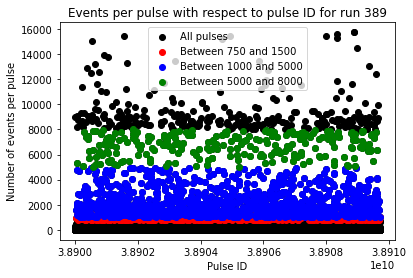

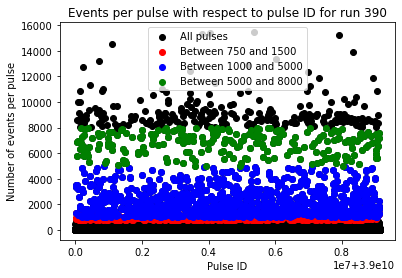

Number of pulses selected across 2 run(s) between 750 and 1500 events: 1463
Number of pulses selected across 2 run(s) between 1000 and 5000 events: 2081
Number of pulses selected across 2 run(s) between 5000 and 8000 events: 507

 Plots for selection between 750 and 1500 events:


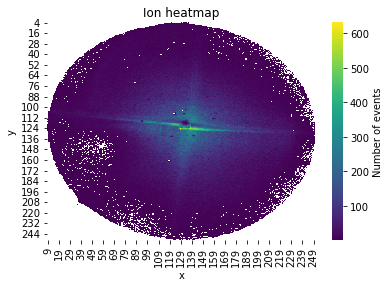

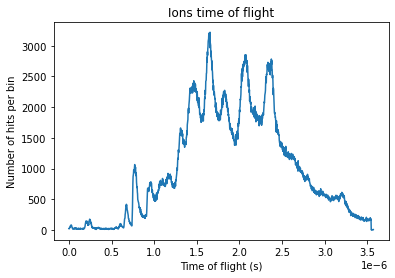

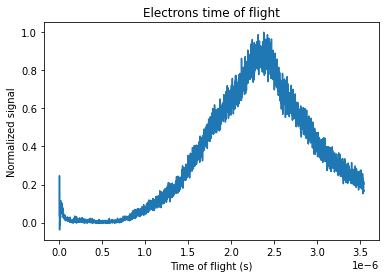

Plots for selection between 1000 and 5000 events:


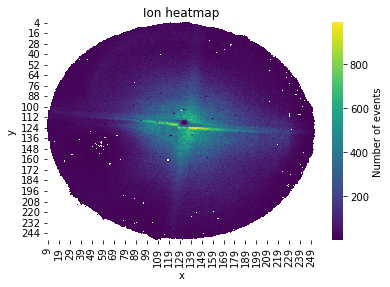

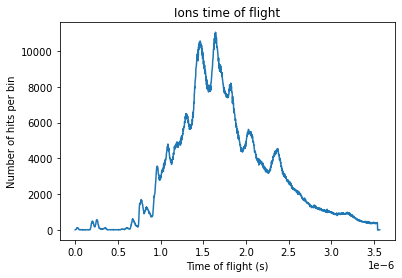

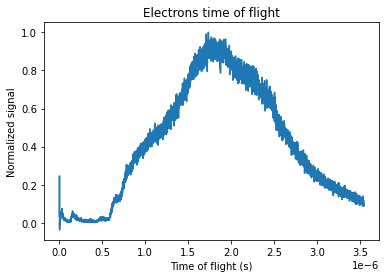

In [5]:
LOWER_BOUND1 = 750
UPPER_BOUND1 = 1500

LOWER_BOUND2 = 1000
UPPER_BOUND2 = 5000

LOWER_BOUND3 = 5000
UPPER_BOUND3 = 8000

THRESHOLDS = [(LOWER_BOUND1, UPPER_BOUND1), (LOWER_BOUND2, UPPER_BOUND2), (LOWER_BOUND3, UPPER_BOUND3)]

selections = events_selection_plots(RUNID,THRESHOLDS)

selected_dfevent1, selected_dfpulse1, selected_etof1 = selections[0]
selected_dfevent2, selected_dfpulse2, selected_etof2 = selections[1]
selected_dfevent3, selected_dfpulse3, selected_etof3 = selections[2]

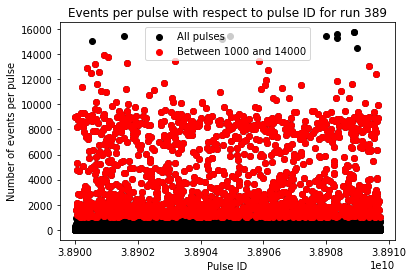

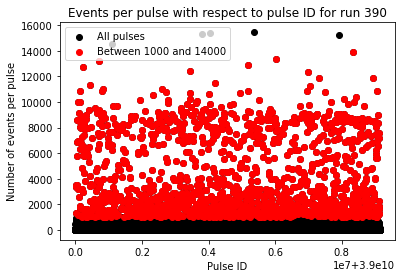

Number of pulses selected across 2 run(s) between 1000 and 14000 events: 3094

 Plots for selection between 1000 and 14000 events:


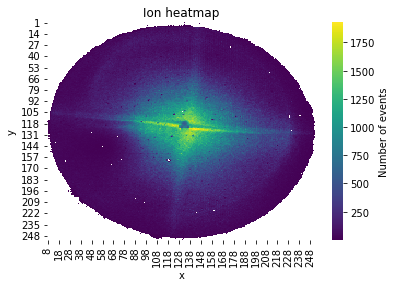

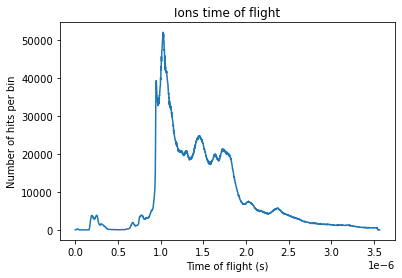

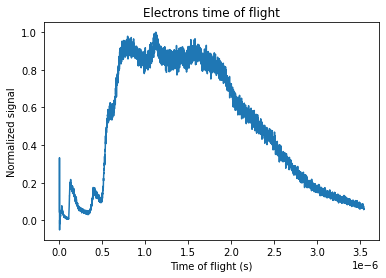

In [6]:
LOWER_BOUND = 1000
UPPER_BOUND = 14000
THRESHOLD = [(LOWER_BOUND,UPPER_BOUND)]

selections = events_selection_plots(RUNID,THRESHOLD)
selected_dfevent, selected_dfpulse, selected_etof = selections[0]

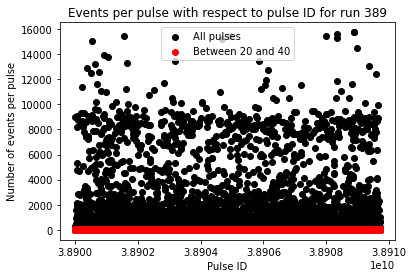

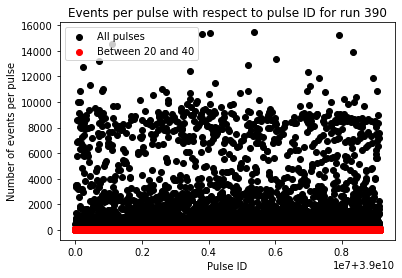

Number of pulses selected across 2 run(s) between 20 and 40 events: 111729


In [7]:
LOWER_BACKGRD_BOUND = 20
UPPER_BACKGRD_BOUND = 40
BKGRD_THRESHOLD = [(LOWER_BACKGRD_BOUND,UPPER_BACKGRD_BOUND)]
DOWNSAMPLING = 200000

backgrd_dfevent, backgrd_dfpulse, backgrd_etof = events_selection(RUNID,BKGRD_THRESHOLD,DOWNSAMPLING)[0]

In [13]:
%matplotlib inline
RUNID = [376,380,382,383,384,386,387,388,389,390,391,393,398,399,400,402,403,404]

In [14]:
LOWER_BOUND = 1000
UPPER_BOUND = 14000
THRESHOLD = [(LOWER_BOUND,UPPER_BOUND)]

ion_dfevent, ion_dfpulse = ion_selection(RUNID,THRESHOLD)[0]

Handling run  376
Handling run  380
Handling run  382
Handling run  383
Handling run  384
Handling run  386
Handling run  387
Handling run  388
Handling run  389
Handling run  390
Handling run  391
Handling run  393
Handling run  398
Handling run  399
Handling run  400
Handling run  402
Handling run  403
Handling run  404
Number of pulses selected across 18 run(s) between 1000 and 14000 events: 42982


In [21]:
LOWER_BACKGRD_BOUND = 20
UPPER_BACKGRD_BOUND = 40
BKGRD_THRESHOLD = [(LOWER_BACKGRD_BOUND,UPPER_BACKGRD_BOUND)]
DOWNSAMPLING = 200000

backgrd_dfevent, backgrd_dfpulse = ion_selection(RUNID,BKGRD_THRESHOLD,DOWNSAMPLING)[0]

Handling run  376
Handling run  380
Handling run  382
Handling run  383
Handling run  384
Handling run  386
Handling run  387
Handling run  388
Handling run  389
Handling run  390
Handling run  391
Handling run  393
Handling run  398
Handling run  399
Handling run  400
Handling run  402
Handling run  403
Handling run  404
Number of pulses selected across 18 run(s) between 20 and 40 events: 68482


## Calibration

In [8]:
X = 127
Y = 117
WIDTH = 13
HEIGHT = 10
ZONE = [X,Y,WIDTH,HEIGHT,0]

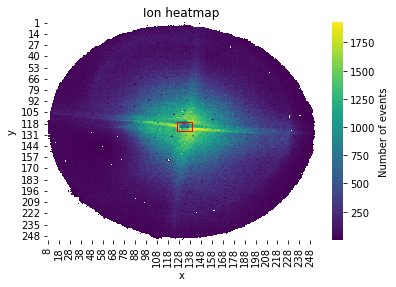

In [9]:
### To test where your square selection is, use:
heatmap_with_zones(selected_dfevent,[ZONE])

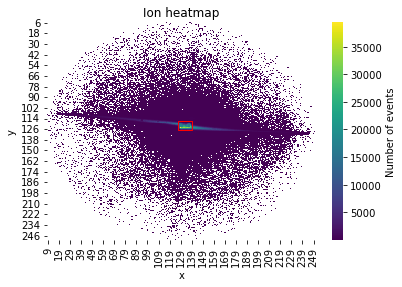

In [10]:
spatial_bkgrd_dfevent,spatial_bkgrd_dfpulse,spatial_bkgrd_etof = spatial_ion_selection(backgrd_dfevent,backgrd_dfpulse,backgrd_etof,[ZONE])

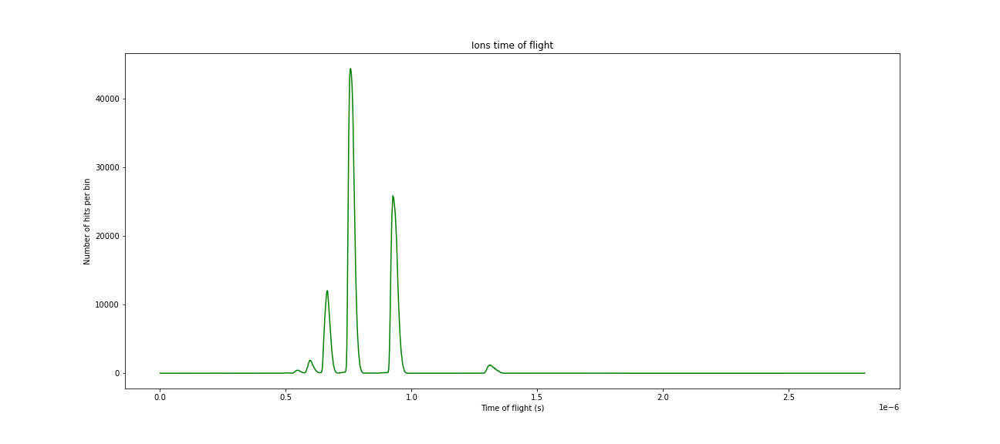

In [11]:
%matplotlib widget
big_ion_tof(spatial_bkgrd_dfevent)

In [ ]:
#CALIBRATION_LINES = [1.312e-6, 9.26e-7, 7.56e-7, 6.65e-7, 5.97e-7]

In [ ]:
%matplotlib inline
a_fit, b_fit = calibrate(spatial_bkgrd_dfevent)

In [12]:
%matplotlib inline
a_fit, b_fit = (29497236325759.32, 2.0175071848701878)

In [13]:
calibrated_selected_dfevent, calibrated_backgrd_dfevent = apply_calibration([selected_dfevent,backgrd_dfevent],a_fit,b_fit)

In [14]:
calibrated_selected_dfevent1, calibrated_backgrd_dfevent = apply_calibration([selected_dfevent1,backgrd_dfevent],a_fit,b_fit)
calibrated_selected_dfevent2, calibrated_backgrd_dfevent = apply_calibration([selected_dfevent2,backgrd_dfevent],a_fit,b_fit)
calibrated_selected_dfevent3, calibrated_backgrd_dfevent = apply_calibration([selected_dfevent3,backgrd_dfevent],a_fit,b_fit)

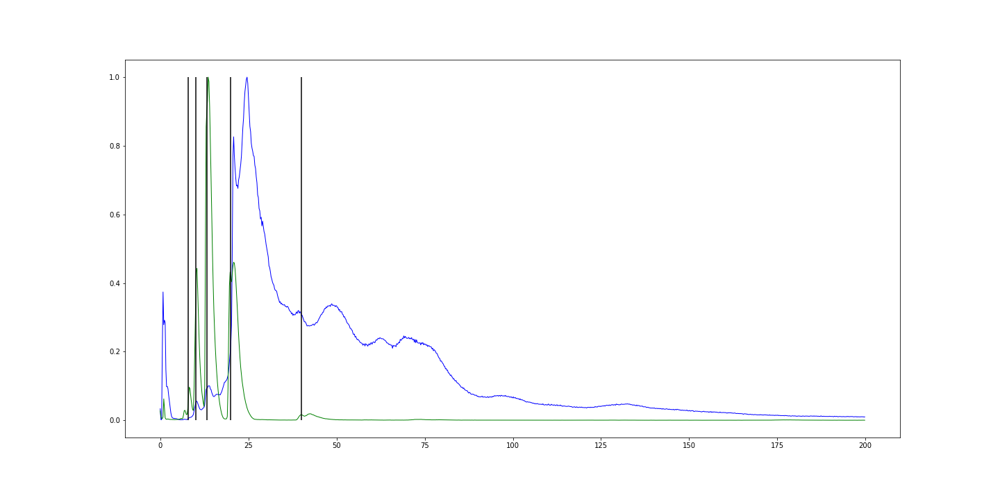

In [15]:
%matplotlib widget
MQ_LINES = [40,20,40/3,40/4,40/5]

plt.figure(figsize=(20, 10))
histselected, bin_edgesselected = np.histogram(calibrated_selected_dfevent.mq, bins=np.linspace(0,200,1000),range=(0,200))
histgrd, bin_edgesgrd = np.histogram(calibrated_backgrd_dfevent.mq, bins=np.linspace(0,200,1000),range=(0,200))
plt.plot(bin_edgesselected[:-1], histselected/max(histselected), linewidth = 1, c='b')
plt.plot(bin_edgesgrd[:-1], histgrd/max(histgrd), linewidth = 1, c='g')
plt.vlines(MQ_LINES,0,1,colors='black')
plt.show()

In [ ]:
%matplotlib widget
big_mq_plot(calibrated_selected_dfevent,2500,(0,150))

## Heatmaps / Etofs

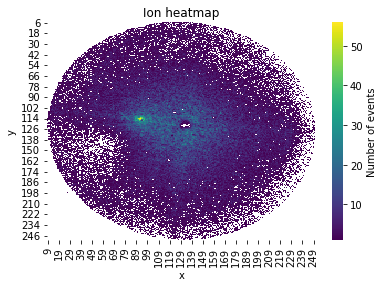

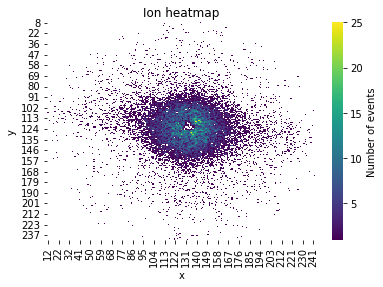

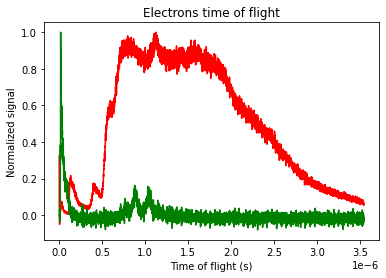

In [16]:
%matplotlib inline
LOWER_MQ = .25
UPPER_MQ = 3

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
mqselected_backgrd_dfevent,mqselected_backgrd_dfpulse,mqselected_backgrd_etof = mq_selection(calibrated_backgrd_dfevent,backgrd_dfpulse,backgrd_etof,LOWER_MQ,UPPER_MQ)

heatmap(mqselected_dfevent)
heatmap(mqselected_backgrd_dfevent)

TIME_BETWEEN_PULSES = 3.54462e-6
CHANNELS_PER_PULSE = 14080
channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    
xaxis = np.arange(14080)*channel_time
avg_mqselected_etof = -np.mean(mqselected_etof, axis=0)
avg_mqbackgrd_etof = -np.mean(mqselected_backgrd_etof, axis=0)
max_mqselected_etof = max(avg_mqselected_etof)
max_mqbackgrd_etof = max(avg_mqbackgrd_etof)

plt.figure()
plt.plot(xaxis,avg_mqselected_etof/max_mqselected_etof,c='r')
plt.plot(xaxis,avg_mqbackgrd_etof/max_mqbackgrd_etof,c='g')
plt.xlabel('Time of flight (s)')
plt.ylabel('Normalized signal')
plt.title('Electrons time of flight')
plt.show()

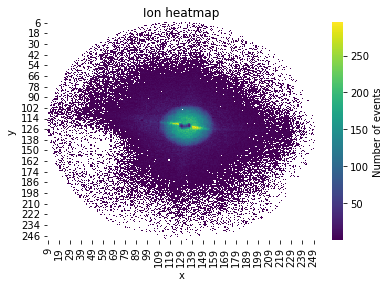

In [17]:
LOWER_MQ = 20.5
UPPER_MQ = 21.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

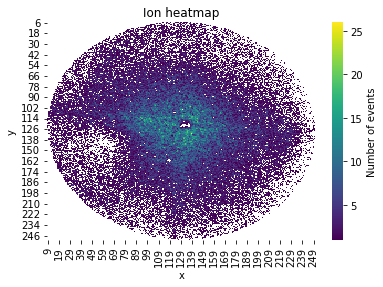

In [18]:
LOWER_MQ = .5
UPPER_MQ = 1.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

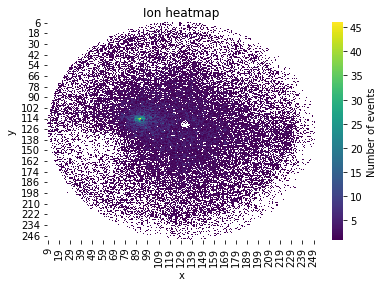

In [19]:
LOWER_MQ = 1.5
UPPER_MQ = 2.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

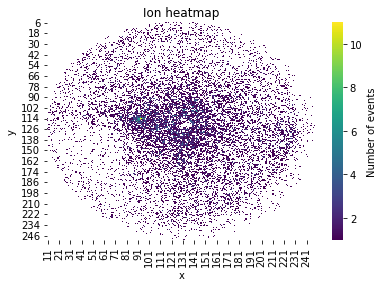

In [20]:
LOWER_MQ = 2.5
UPPER_MQ = 3.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

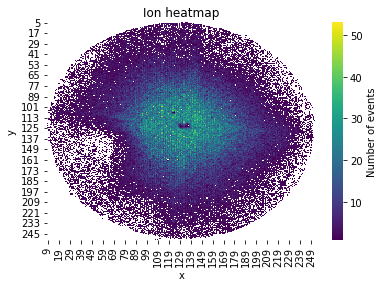

In [21]:
LOWER_MQ = 27.5
UPPER_MQ = 28.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

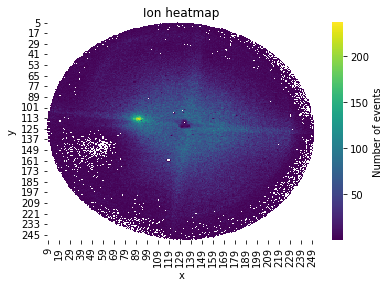

In [22]:
LOWER_MQ = 37.5
UPPER_MQ = 44.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

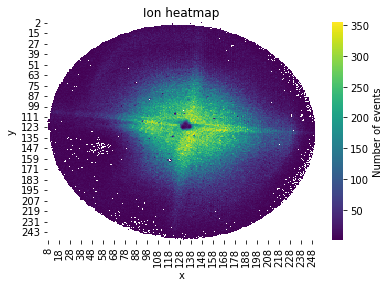

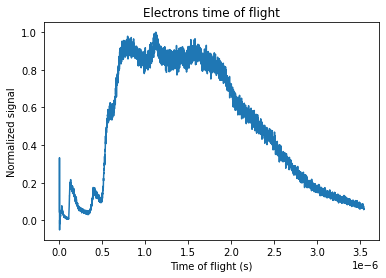

In [23]:
LOWER_MQ = 60
UPPER_MQ = 100

mqselected_dfevent1,mqselected_dfpulse1,mqselected_etof1 = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent1)
e_tof(mqselected_etof1)

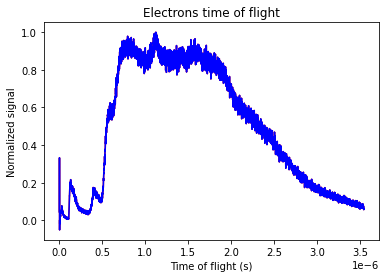

In [24]:
avg_mqselected_etof = -np.mean(mqselected_etof, axis=0)
avg_mqselected_etof1 = -np.mean(mqselected_etof1, axis=0)
max_mqselected_etof = max(avg_mqselected_etof)
max_mqselected_etof1 = max(avg_mqselected_etof1)

plt.figure()
plt.plot(xaxis,avg_mqselected_etof/max_mqselected_etof,c='r')
plt.plot(xaxis,avg_mqselected_etof1/max_mqselected_etof1,c='b')
plt.xlabel('Time of flight (s)')
plt.ylabel('Normalized signal')
plt.title('Electrons time of flight')
plt.show()

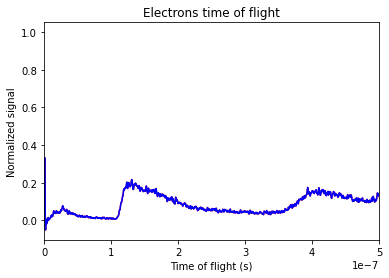

In [25]:
plt.figure()
plt.plot(xaxis,avg_mqselected_etof/max_mqselected_etof,c='r')
plt.plot(xaxis,avg_mqselected_etof1/max_mqselected_etof1,c='b')
plt.xlabel('Time of flight (s)')
plt.ylabel('Normalized signal')
plt.title('Electrons time of flight')
plt.xlim(0,500e-9)
plt.show()

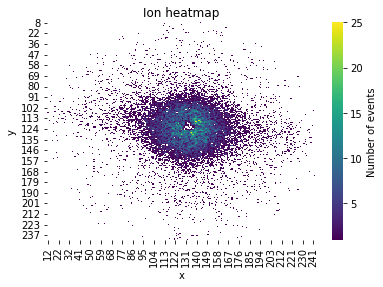

In [26]:
LOWER_MQ = .25
UPPER_MQ = 3

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_backgrd_dfevent,backgrd_dfpulse,backgrd_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

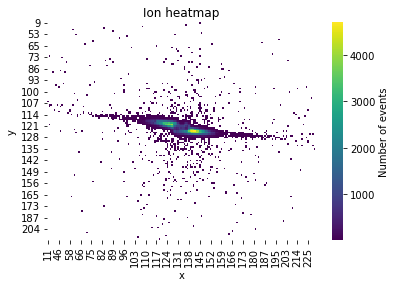

In [27]:
LOWER_MQ = 20.5
UPPER_MQ = 21.5

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_backgrd_dfevent,backgrd_dfpulse,backgrd_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

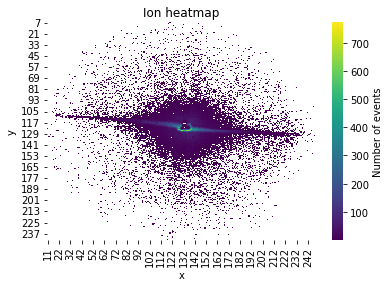

In [28]:
LOWER_MQ = 35
UPPER_MQ = 100

mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_backgrd_dfevent,backgrd_dfpulse,backgrd_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

In [29]:
hist, bin_edges = np.histogram(selected_dfevent.tof, bins=250000)
hist1 = hist[:1500]
bin_edges1 = bin_edges[:1501]
    
TIME_BETWEEN_PULSES = 3.54462e-6
CHANNELS_PER_PULSE = 14080
channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    
xaxis = np.arange(14080)*channel_time
avg_selected_etof = -np.mean(selected_etof, axis=0)

In [30]:
hist, bin_edges = np.histogram(backgrd_dfevent.tof, bins=250000)
hist1 = hist[:1500]
bin_edges1 = bin_edges[:1501]
    
TIME_BETWEEN_PULSES = 3.54462e-6
CHANNELS_PER_PULSE = 14080
channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    
xaxis = np.arange(14080)*channel_time
avg_selected_etof = -np.mean(backgrd_etof, axis=0)

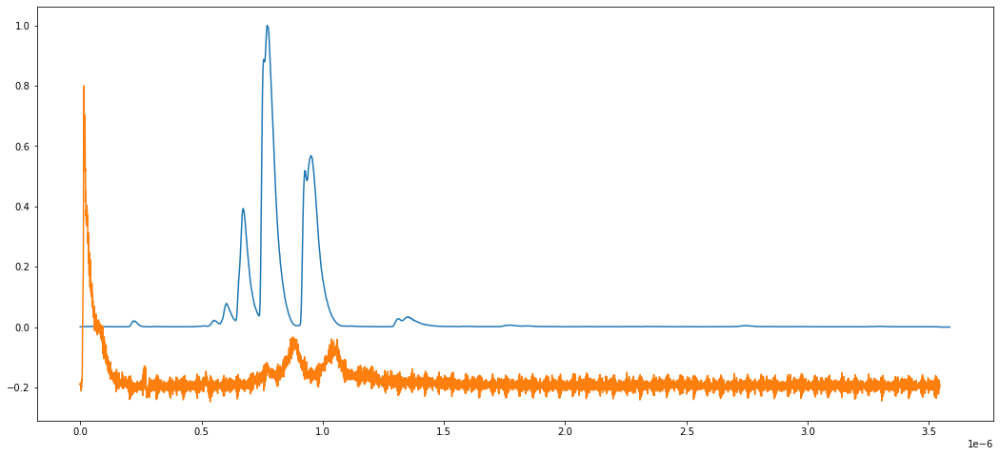

In [31]:
plt.figure(figsize=(18, 8))
plt.plot(bin_edges1[:-1], hist1/max(hist1))
plt.plot(xaxis,avg_selected_etof/max(avg_selected_etof)-.2)
plt.show()

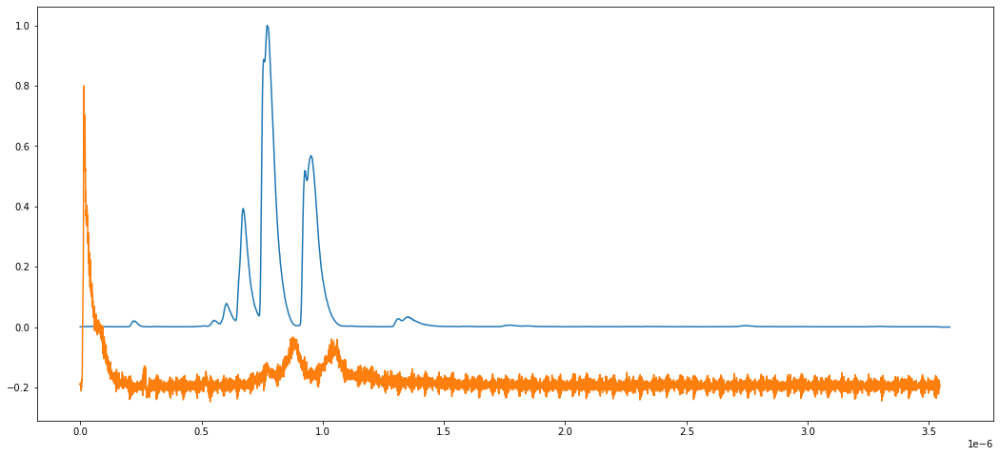

In [32]:
plt.figure(figsize=(18, 8))
plt.plot(bin_edges1[:-1], hist1/max(hist1))
plt.plot(xaxis,avg_selected_etof/max(avg_selected_etof)-.2)
plt.show()

## Fish plots

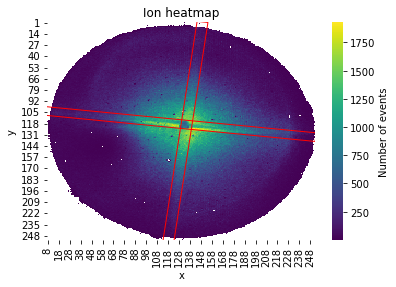

In [33]:
# Define a list of tuples where each tuple represents a tilted zone (x, y, width, height, angle)
ZONES = [(0, 98, 256, 10, 7), (145, 0, 10, 256, 7)]  # Add the angle of rotation in degrees
spatial_selected_dfevent,spatial_selected_dfpulse,spatial_selected_etof = tilted_spatial_ion_selection(selected_dfevent, selected_dfpulse, selected_etof, ZONES)

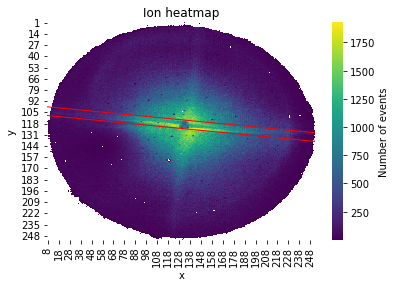

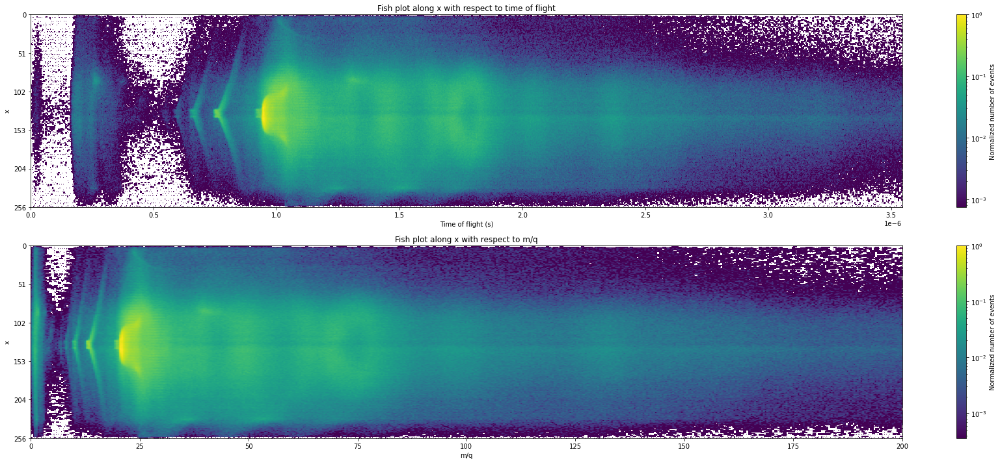

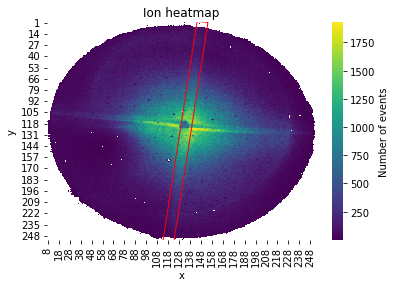

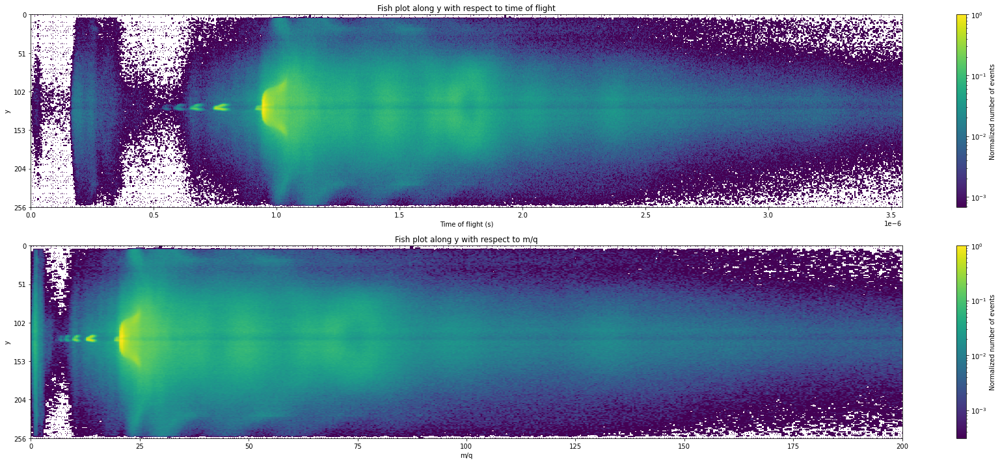

In [34]:
X_ZONE = (0, 98, 256, 10, 7)
Y_ZONE = (145, 0, 10, 256, 7)
TOF_BINS = 1000
MQ_BINS = 500

fish_plot_x(selected_dfevent,X_ZONE,TOF_BINS,MQ_BINS)
fish_plot_y(selected_dfevent,Y_ZONE)

## Number of events filtering (waterfalls, heatmaps)

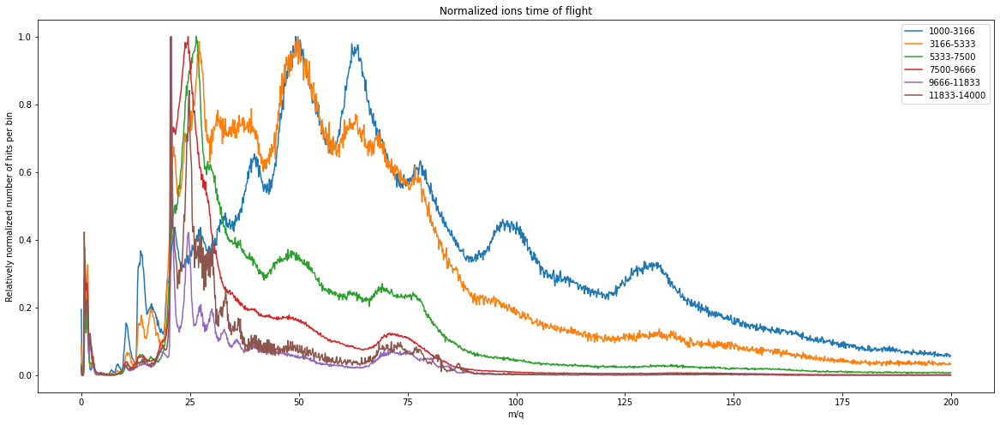

In [35]:
BINS = 6

filtered_dfs = nevents_binning1(calibrated_selected_dfevent,selected_dfpulse,BINS)

In [36]:
NBINS_MQ = 1500
NBINS_EVENTS = 20

filtered_dfevents, filtered_dfpulses, filtered_etofs, hists, bins = nevents_binning(calibrated_selected_dfevent,selected_dfpulse,selected_etof,NBINS_EVENTS,NBINS_MQ)

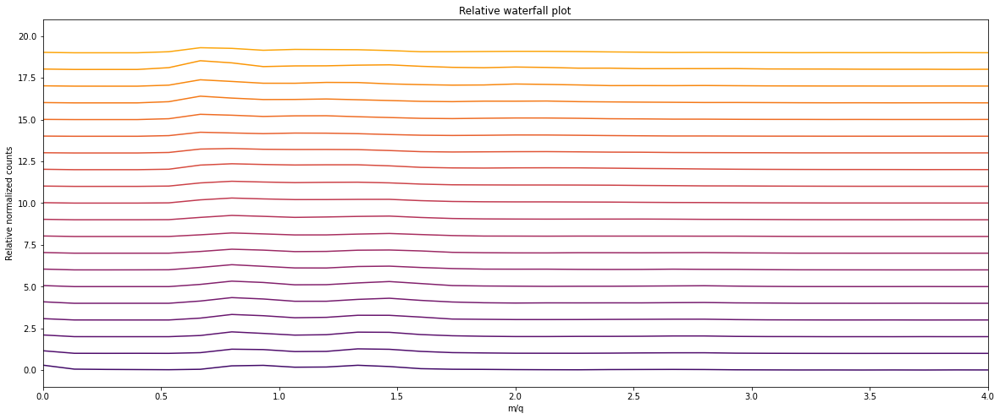

In [37]:
waterfall_rel(hists,NBINS_MQ,(0,4))

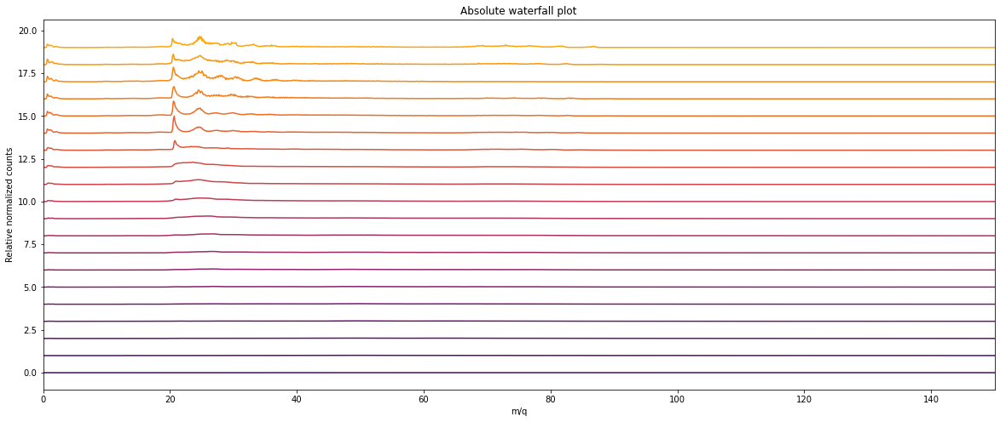

In [38]:
waterfall_abs(hists,NBINS_MQ,(0,150))

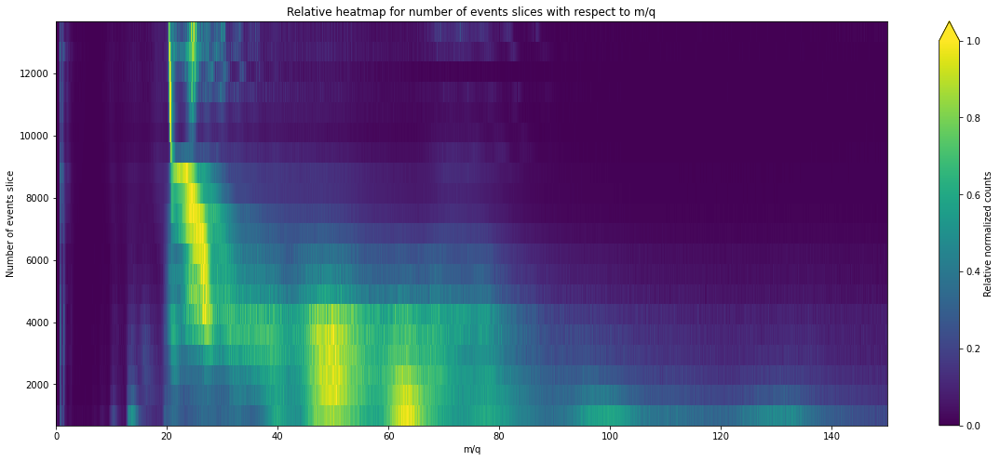

In [39]:
nevents_heatmap_rel(hists,NBINS_MQ,bins,(0,150))

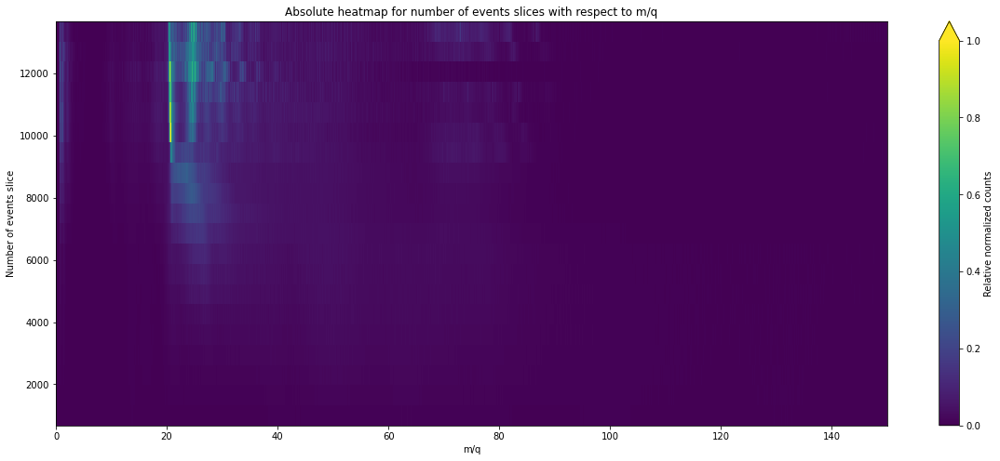

In [40]:
nevents_heatmap_abs(hists,NBINS_MQ,bins,(0,150))

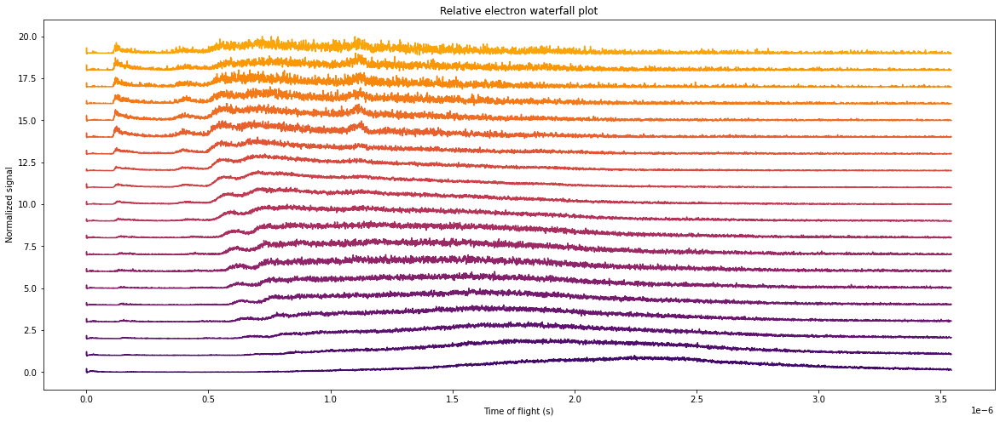

In [43]:
waterfall_etof(filtered_etofs)

## Presentation plots

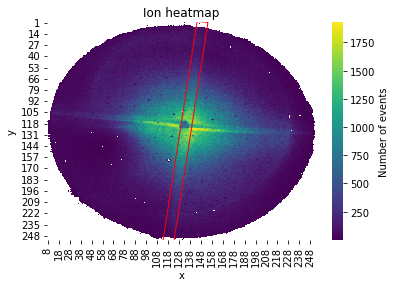

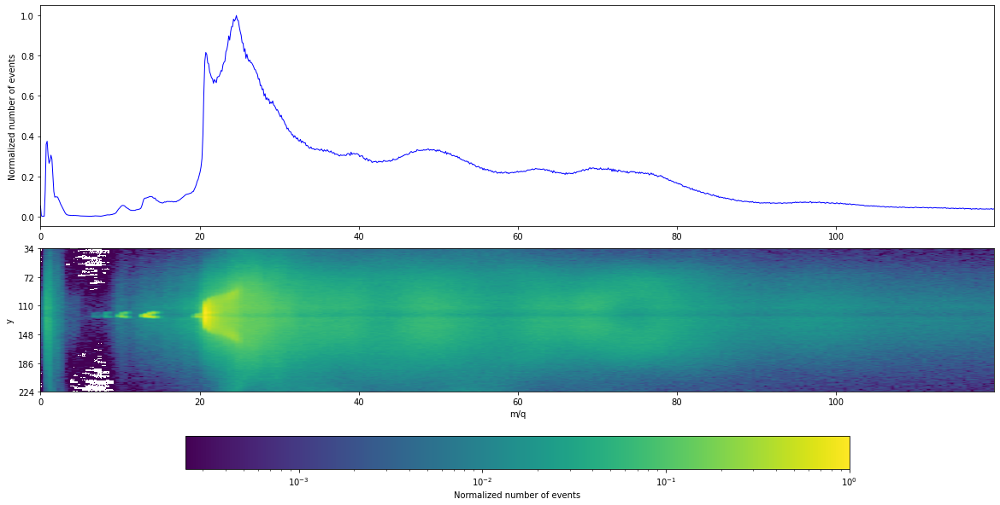

In [44]:
from matplotlib import gridspec

# Compute main plot data
histselected, bin_edgesselected = np.histogram(calibrated_selected_dfevent.mq, bins=np.linspace(0,120,1000),range=(0,120))

# Compute heatmap subplot data
Y_ZONE = (145, 0, 10, 256, 7)
fish_dfevent = fish_plot_ion_selection(selected_dfevent,Y_ZONE)
fish_dfevent_yfiltered = fish_dfevent[fish_dfevent.y > 32][fish_dfevent.y < 224]

mq_bins = 241
mq_bin_edges = np.linspace(0,120,mq_bins)
fish_dfevent_yfiltered['mq_bin'] = pd.cut(fish_dfevent_yfiltered['mq'], bins=mq_bin_edges, labels=False)

heatmap_data = fish_dfevent_yfiltered.pivot_table(index='y', columns='mq_bin', aggfunc='size', fill_value=0)

max_value = heatmap_data.values.max()
normalized_data = heatmap_data.values / max_value

# Create a figure with gridspec
fig = plt.figure(figsize=(20, 10))
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0.1)

# Create main plot
ax_main = plt.subplot(gs[0])
x = bin_edgesselected[:-1]
ax_main.plot(x, histselected/max(histselected), linewidth = 1, c='b')
ax_main.set_ylabel('Normalized number of events')

# Create heatmap subplot
ax_heatmap = plt.subplot(gs[1], sharex=ax_main)
cax = ax_heatmap.imshow(normalized_data, cmap='viridis', aspect='auto', norm=LogNorm(), extent=[x.min(), x.max(), 0, 1])
ax_heatmap.set_xlabel('m/q')
ax_heatmap.set_yticklabels(np.linspace(224,34,6,dtype=int))
ax_heatmap.set_ylabel('y')

# Add colorbar
cbar = plt.colorbar(cax, ax=ax_heatmap, label='Normalized number of events', norm=LogNorm(), orientation='horizontal', pad=0.2)

plt.show()

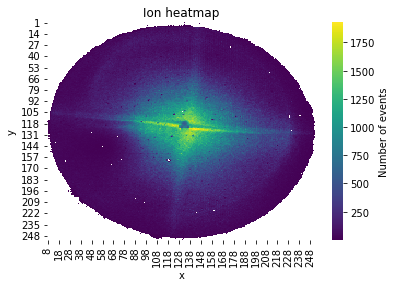

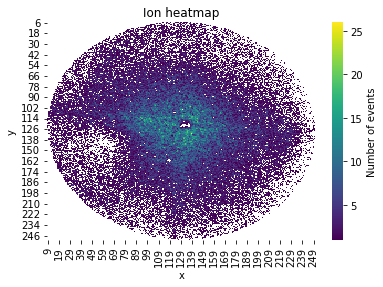

In [45]:
heatmap(calibrated_selected_dfevent)

LOWER_MQ = .5
UPPER_MQ = 1.5
mqselected_dfevent,mqselected_dfpulse,mqselected_etof = mq_selection(calibrated_selected_dfevent,selected_dfpulse,selected_etof,LOWER_MQ,UPPER_MQ)
heatmap(mqselected_dfevent)

In [46]:
NBINS_MQ = 5000
NBINS_EVENTS = 300
xlimits = (0,5)

filtered_dfevents, filtered_dfpulses, filtered_etofs, hists, bins = nevents_binning(calibrated_selected_dfevent,selected_dfpulse,selected_etof,NBINS_EVENTS,NBINS_MQ)

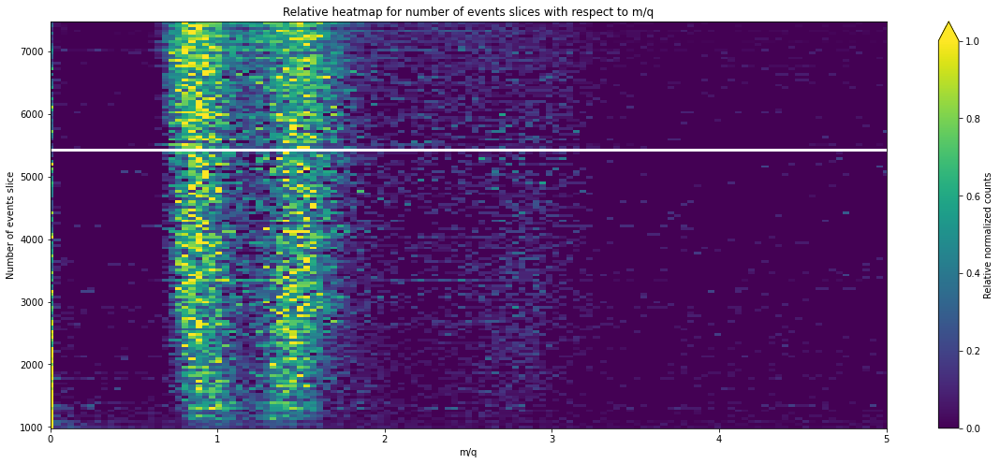

In [47]:
precision = 200/NBINS_MQ
x_lower, x_upper = xlimits
hist_lower, hist_upper = int(x_lower/precision), int(x_upper/precision)
nbins = len(hists)-150
hists_norm = []
    
for i in range(nbins):
    
    shortened_hist = hists[i][hist_lower:hist_upper]
    hist_norm = shortened_hist / max(shortened_hist)
    hists_norm.append(hist_norm)

x_edges = np.linspace(x_lower, x_upper, hist_upper-hist_lower)
y_edges = bins[:-1-150]
X, Y = np.meshgrid(x_edges, y_edges)

plt.figure(figsize=(20, 8))
c = plt.pcolormesh(X, Y, hists_norm, shading='auto')
plt.colorbar(c, label='Relative normalized counts', extend='max')
plt.xlabel('m/q')
plt.ylabel('Number of events slice')
plt.title('Relative heatmap for number of events slices with respect to m/q')
plt.xlim(x_lower, x_upper)
plt.show()

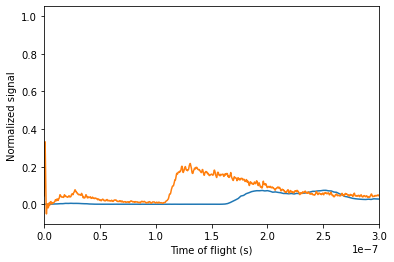

In [48]:
hist, bin_edges = np.histogram(calibrated_selected_dfevent.tof, bins=250000)
hist1 = hist[:1500]
bin_edges1 = bin_edges[:1501]

channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE
    
xaxis = np.arange(CHANNELS_PER_PULSE)*channel_time
avg_selected_etof = -np.mean(selected_etof, axis=0)
    
plt.figure()
plt.plot(bin_edges1[:-1], hist1/max(hist1))
plt.plot(xaxis,avg_selected_etof/max(avg_selected_etof))
plt.xlabel('Time of flight (s)')
plt.ylabel('Normalized signal')
plt.xlim(0,3e-7)
plt.show()

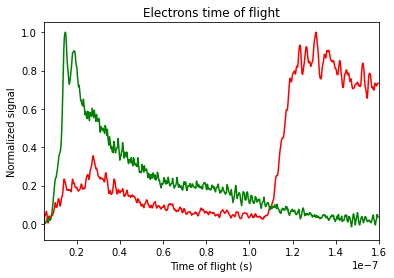

In [49]:
X_LIMITS = (5e-9,16e-8)


channel_time = TIME_BETWEEN_PULSES/CHANNELS_PER_PULSE

lower_xlimit, upper_xlimit = X_LIMITS
lower_int_xlimit, upper_int_xlimit = int(lower_xlimit/channel_time), int(upper_xlimit/channel_time)
shortened_etof = selected_etof[:,lower_int_xlimit:upper_int_xlimit]
shortened_backgrd_etof = backgrd_etof[:,lower_int_xlimit:upper_int_xlimit]
    
xaxis = np.arange(lower_int_xlimit,upper_int_xlimit)*channel_time
avg_selected_etof = -np.mean(shortened_etof, axis=0)
avg_backgrd_etof = -np.mean(shortened_backgrd_etof, axis=0)
max_selected_etof = max(avg_selected_etof)
max_backgrd_etof = max(avg_backgrd_etof)

plt.figure()
plt.plot(xaxis,avg_selected_etof/max_selected_etof,c='r')
plt.plot(xaxis,avg_backgrd_etof/max_backgrd_etof,c='g')
plt.xlabel('Time of flight (s)')
plt.ylabel('Normalized signal')
plt.title('Electrons time of flight')
plt.xlim(lower_xlimit, upper_xlimit)
plt.show()

## Covariances

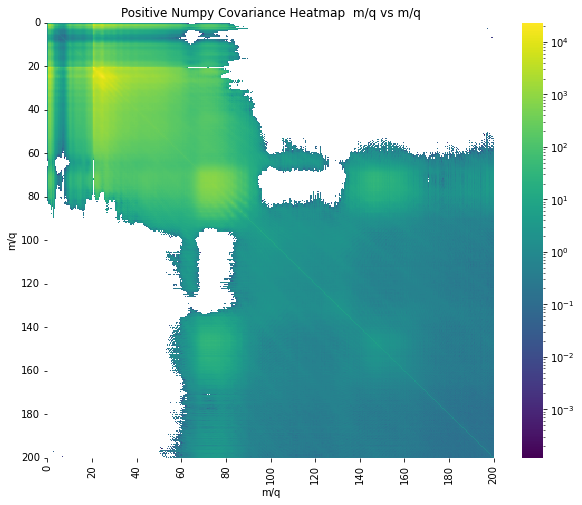

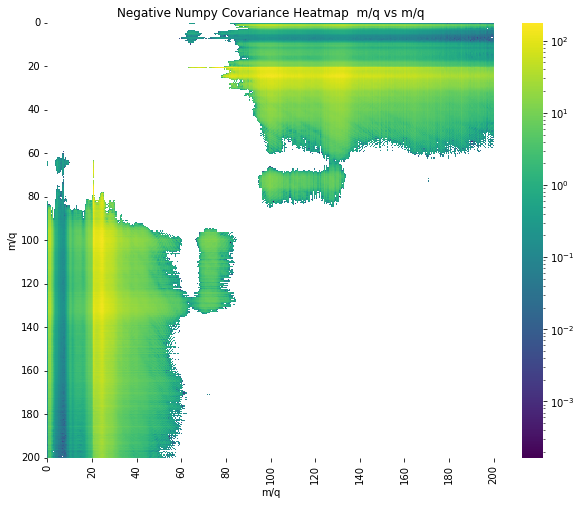

In [50]:
MQ_BINS = 400

mq_np_covariance(calibrated_selected_dfevent,MQ_BINS)

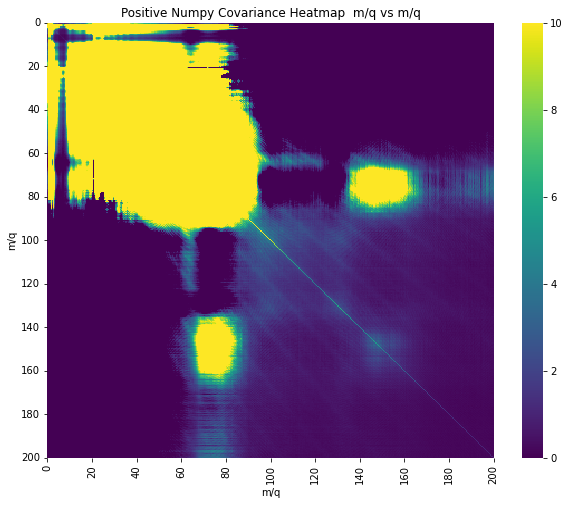

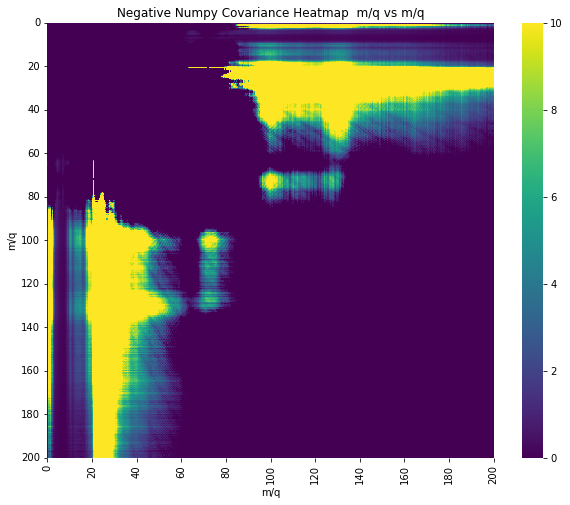

In [52]:
LOG = False
VMIN = -10
VMAX = 10
    
mq_np_covariance(calibrated_selected_dfevent,MQ_BINS,LOG,VMIN,VMAX)

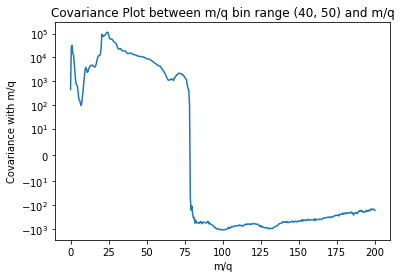

In [54]:
MQ_BINS = 400
MQ_BIN_RANGE = (40,50)

mq_covariance_1d(calibrated_selected_dfevent,MQ_BIN_RANGE,MQ_BINS)

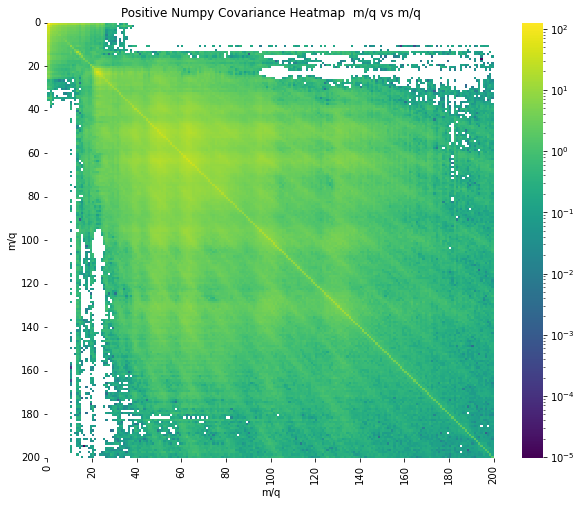

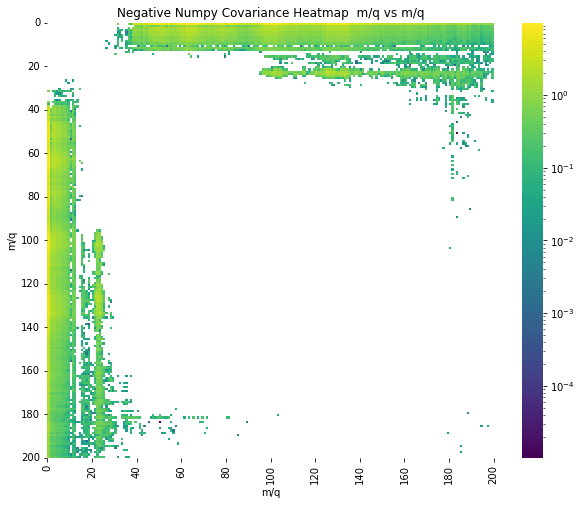

In [55]:
mq_np_covariance(calibrated_selected_dfevent1)

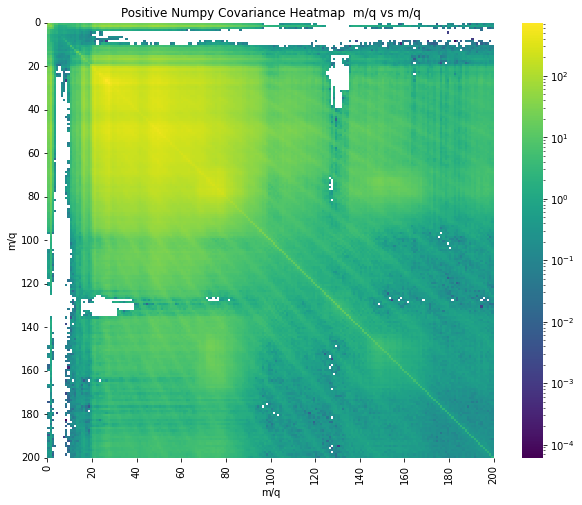

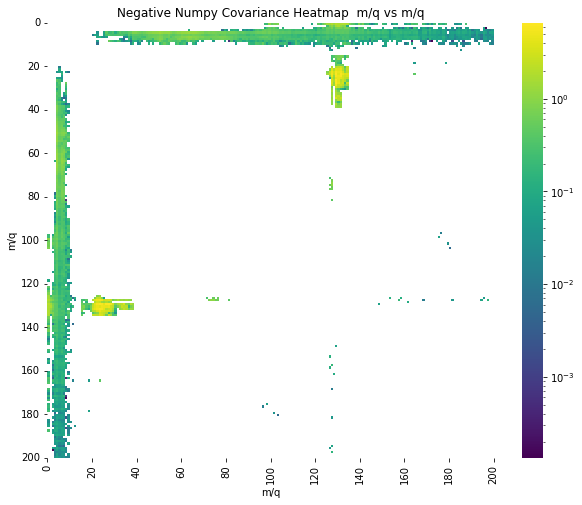

In [56]:
mq_np_covariance(calibrated_selected_dfevent2)

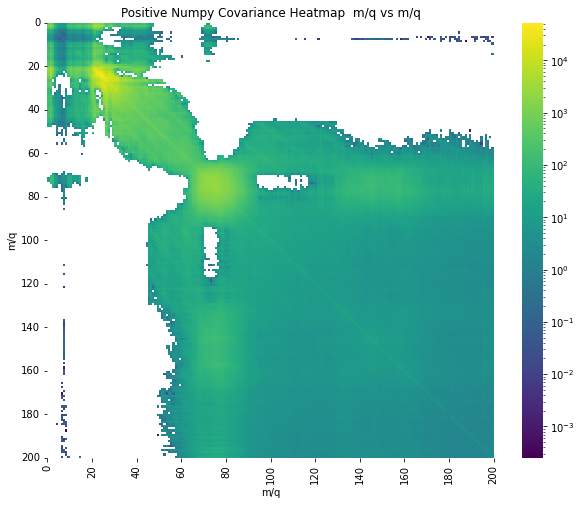

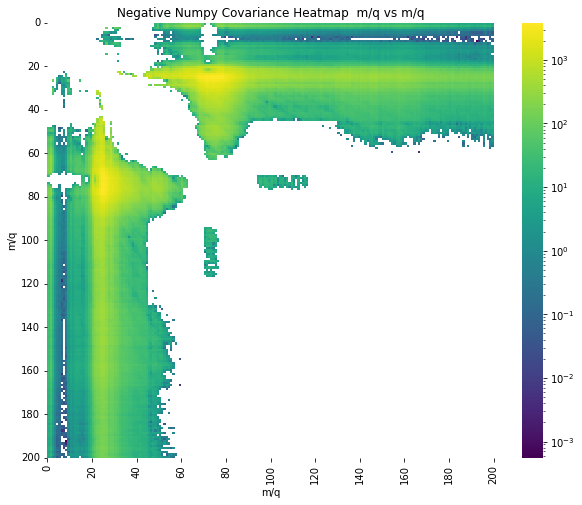

In [57]:
mq_np_covariance(calibrated_selected_dfevent3)

In [58]:
new_calibrated_selected_dfevent = fix_missing_row(calibrated_selected_dfevent,selected_dfpulse,MQ_BINS)

calculating covariance
calculated syx
calculated syi
calculated six


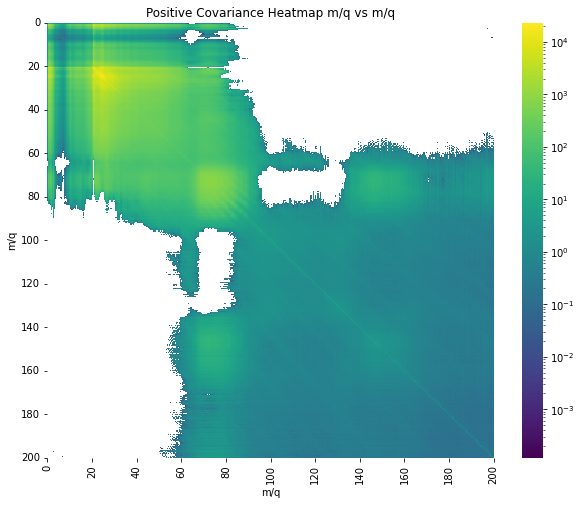

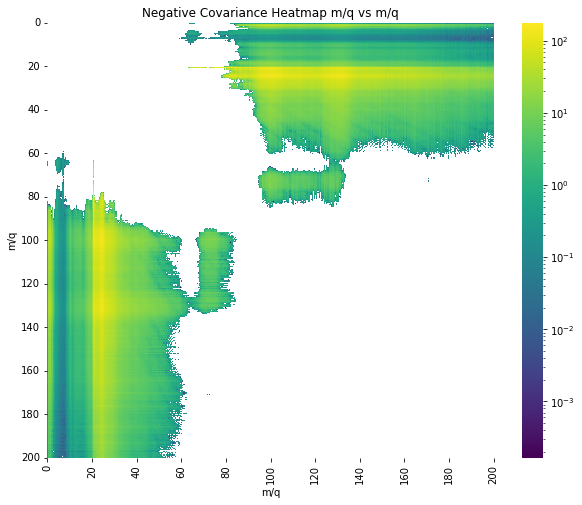

In [59]:
mq_covariance(new_calibrated_selected_dfevent,selected_dfpulse,MQ_BINS)

calculating covariance
calculated syx
calculated syi
calculated six


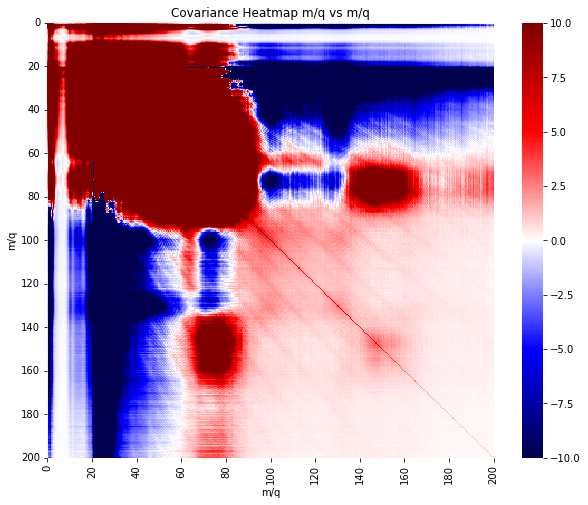

In [60]:
mq_covariance(new_calibrated_selected_dfevent,selected_dfpulse,MQ_BINS,LOG,VMIN,VMAX)

alpha =  1.0
calculating covariance
calculated syx
calculated syi
calculated six


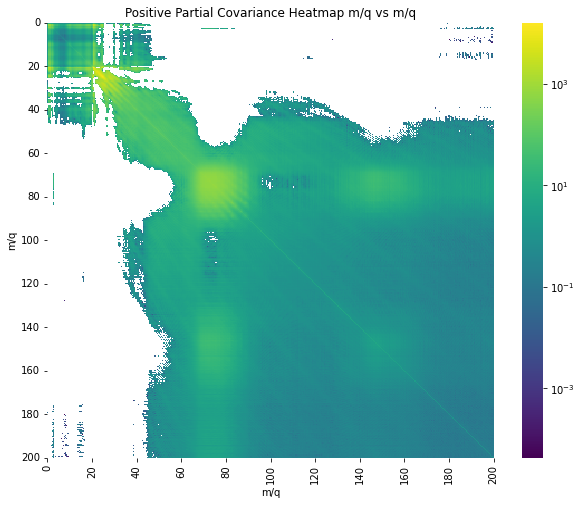

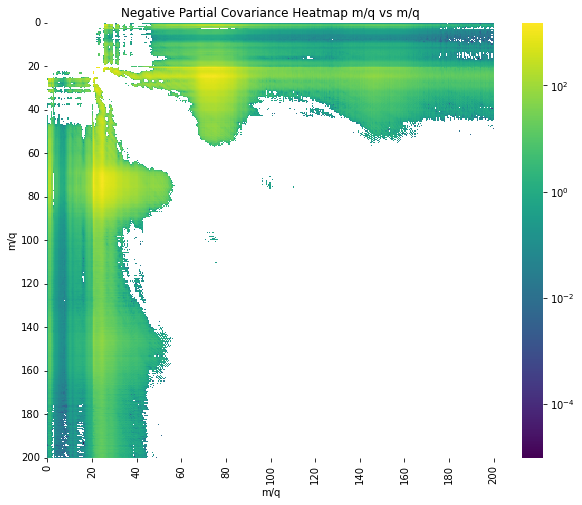

alpha =  1.1
calculating covariance
calculated syx
calculated syi
calculated six


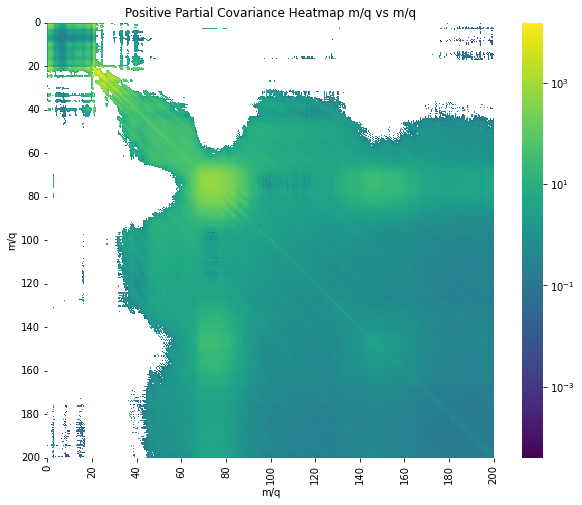

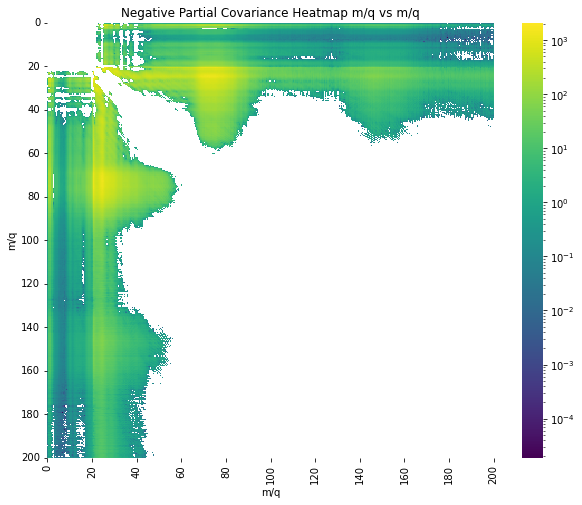

alpha =  1.2000000000000002
calculating covariance
calculated syx
calculated syi
calculated six


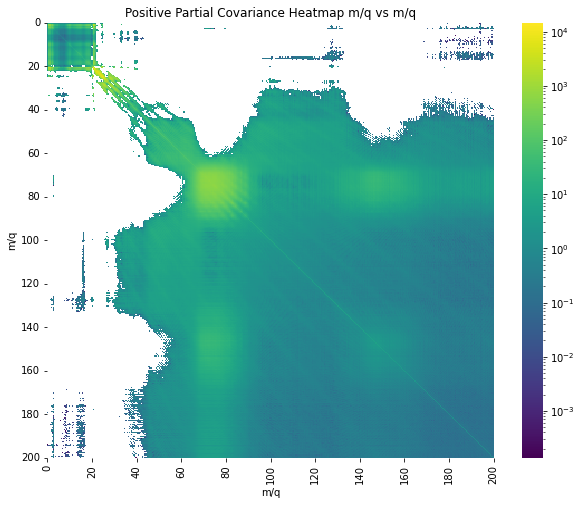

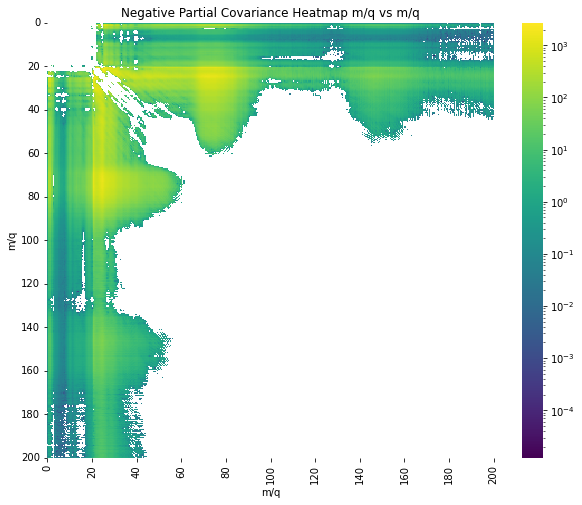

alpha =  1.3000000000000003
calculating covariance
calculated syx
calculated syi
calculated six


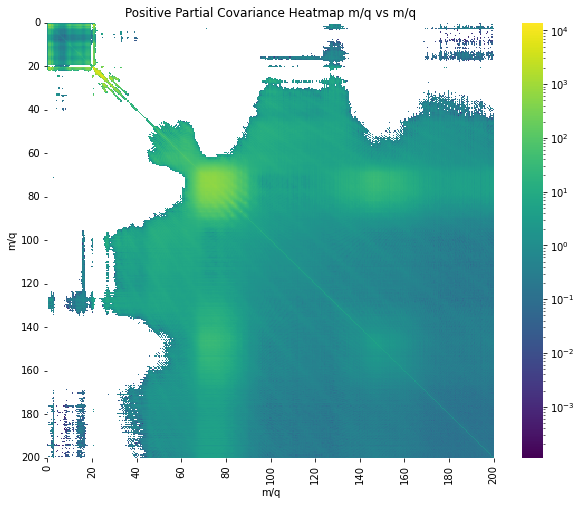

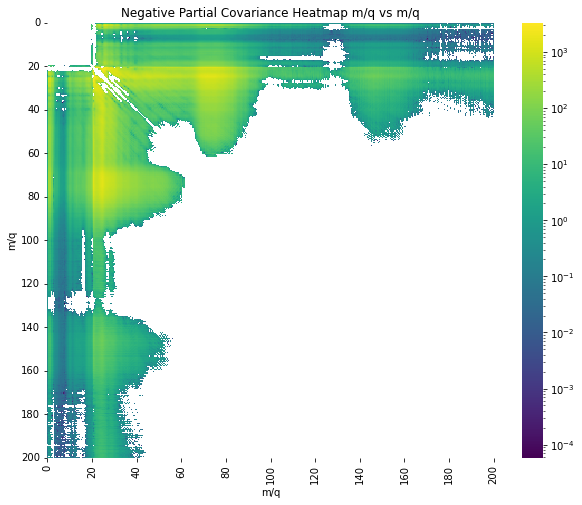

alpha =  1.4000000000000004
calculating covariance
calculated syx
calculated syi
calculated six


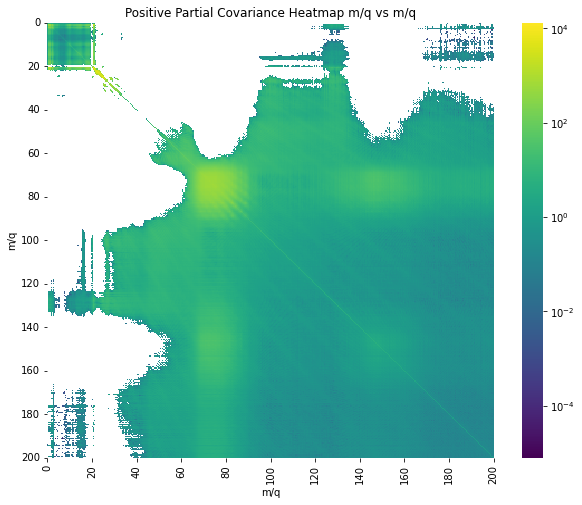

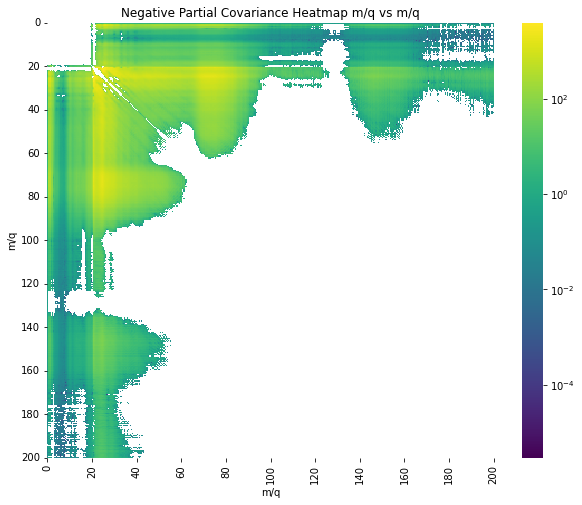

alpha =  1.5000000000000004
calculating covariance
calculated syx
calculated syi
calculated six


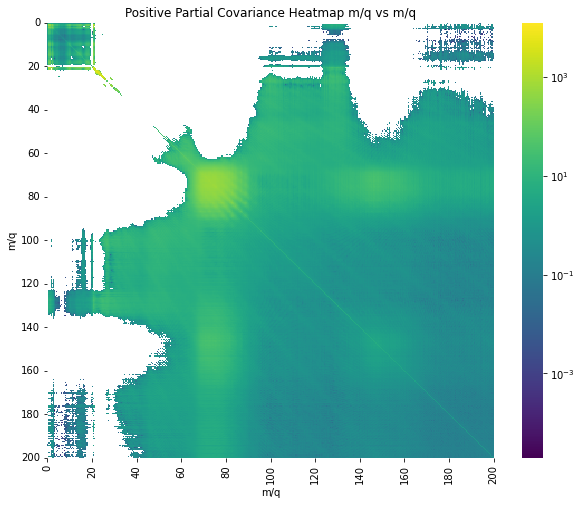

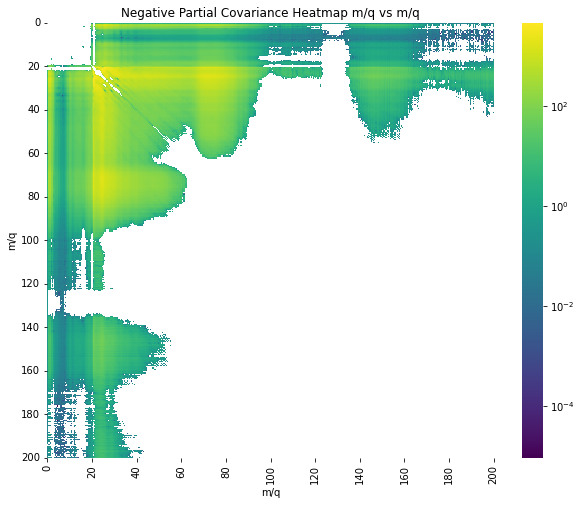

In [61]:
for ALPHA in np.arange(1,1.51,.1):
    print('alpha = ', ALPHA)
    mq_partial_covariance(calibrated_selected_dfevent,selected_dfpulse,MQ_BINS,ALPHA)

alpha =  1.0
calculating covariance
calculated syx
calculated syi
calculated six


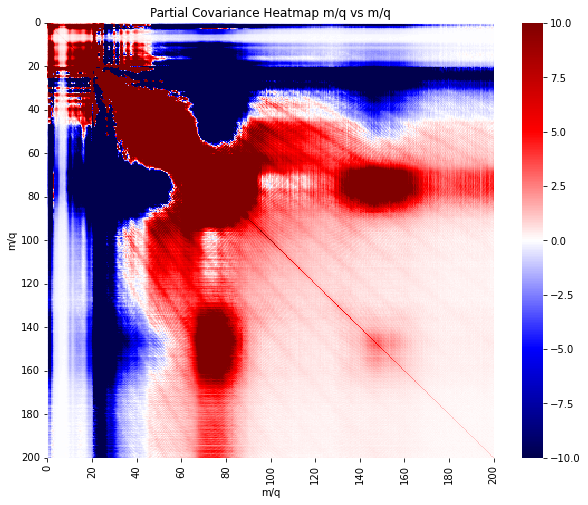

alpha =  1.1
calculating covariance
calculated syx
calculated syi
calculated six


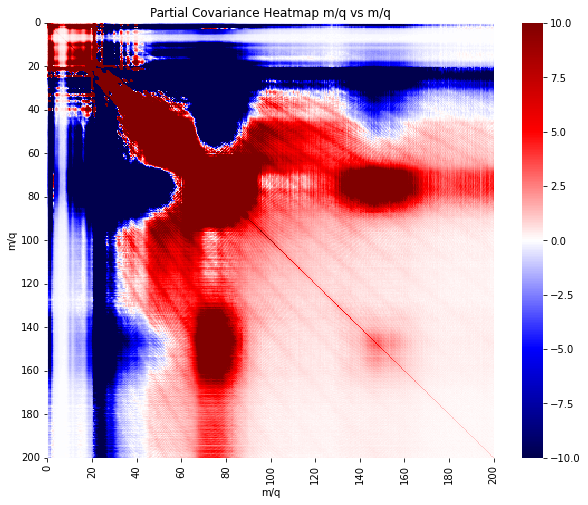

alpha =  1.2000000000000002
calculating covariance
calculated syx
calculated syi
calculated six


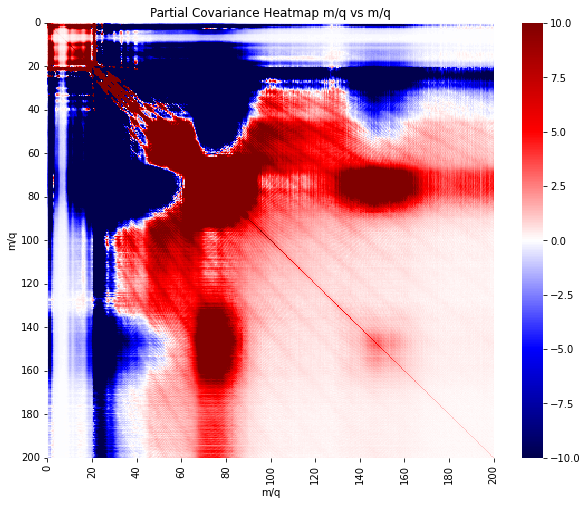

alpha =  1.3000000000000003
calculating covariance
calculated syx
calculated syi
calculated six


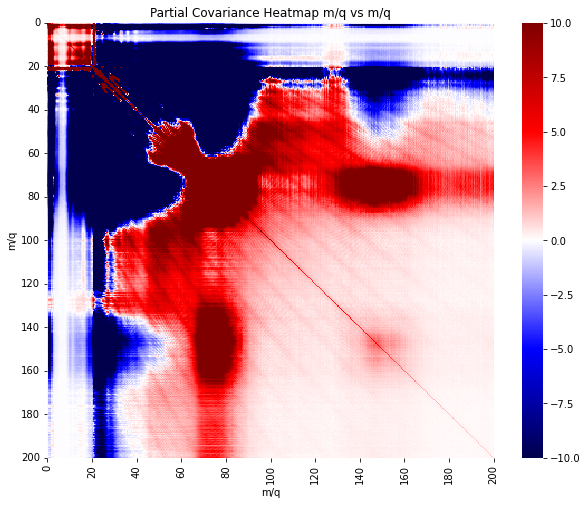

alpha =  1.4000000000000004
calculating covariance
calculated syx
calculated syi
calculated six


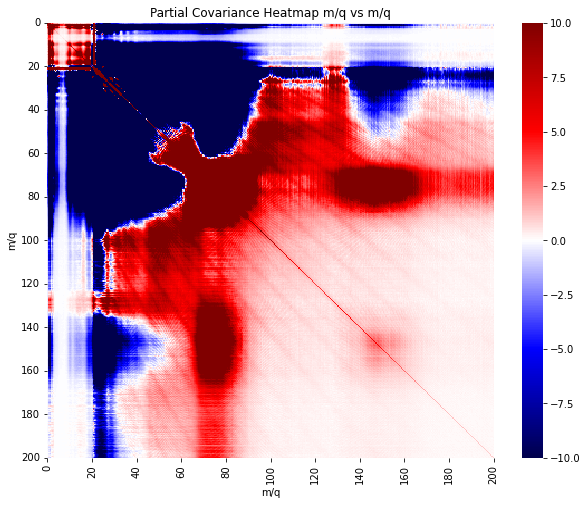

alpha =  1.5000000000000004
calculating covariance
calculated syx
calculated syi
calculated six


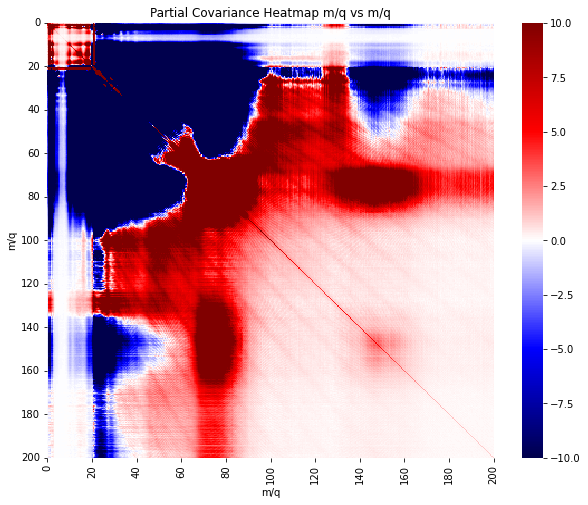

In [62]:
for ALPHA in np.arange(1,1.51,.1):
    print('alpha = ', ALPHA)
    mq_partial_covariance(calibrated_selected_dfevent,selected_dfpulse,MQ_BINS,ALPHA,LOG,VMIN,VMAX)

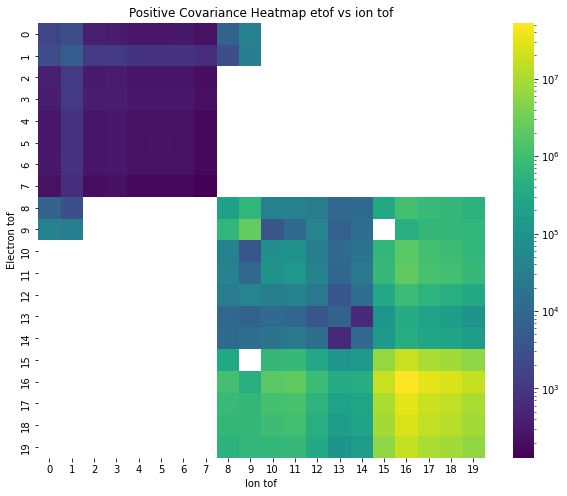

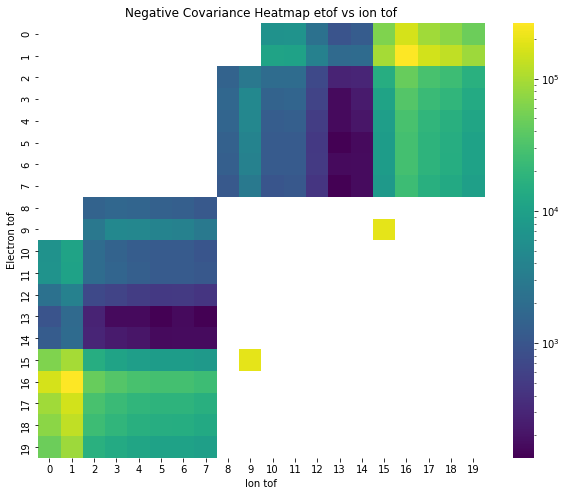

In [63]:
NBINS_EVENTS = 20
NBINS_TOF = 10
MAX_X_LIMIT = 200e-9

etof_ion_covariance(calibrated_selected_dfevent,selected_dfpulse,selected_etof,NBINS_EVENTS,NBINS_TOF,MAX_X_LIMIT)

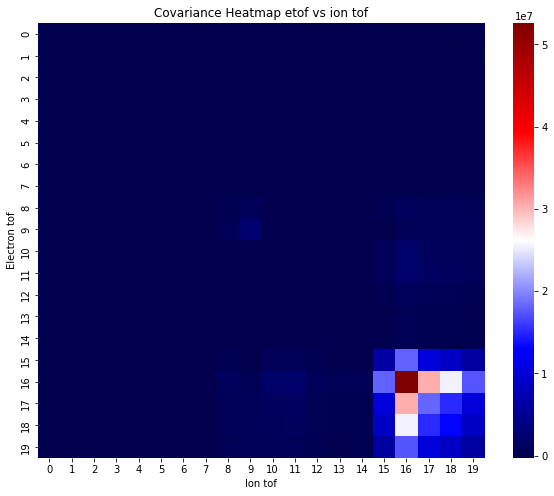

In [64]:
etof_ion_covariance(calibrated_selected_dfevent,selected_dfpulse,selected_etof,NBINS_EVENTS,NBINS_TOF,MAX_X_LIMIT,LOG)